In [1]:
%matplotlib ipympl

import numpy as np
import matplotlib.pyplot as plt

In [2]:
# read point clouds data from txt file, each row is a point (x,y,z)
point_clouds = np.loadtxt('tls_points.txt')
print(f"Total points in point cloud: {point_clouds.shape[0]}")

Total points in point cloud: 177748


# Keep only the tree

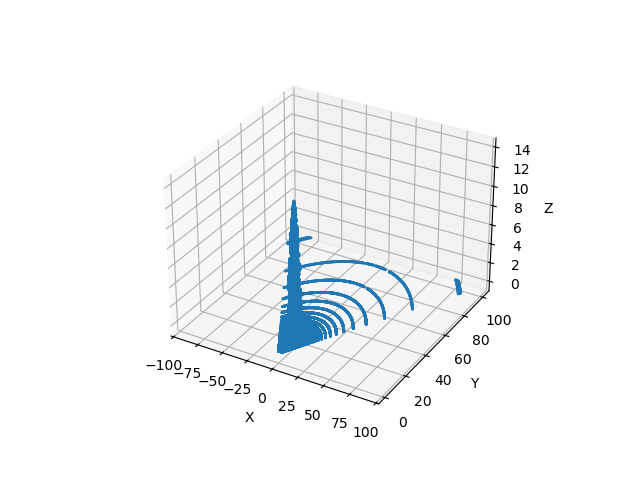

In [3]:
# plot the point clouds interactively
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(point_clouds[:,0], point_clouds[:,1], point_clouds[:,2], s=1)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.show()

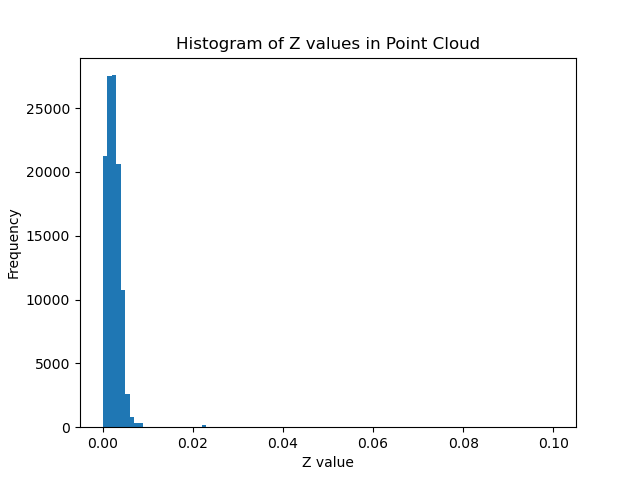

In [4]:
# remove all z points below a certain threshold (e.g., ground level)
# plot histogram of z values to determine threshold
# new plot
fig = plt.figure()
plt.hist(point_clouds[:,2], bins=100, range=(0, 0.1))
plt.xlabel('Z value')
plt.ylabel('Frequency')
plt.title('Histogram of Z values in Point Cloud')
plt.show()

Points after removing ground level: 30960


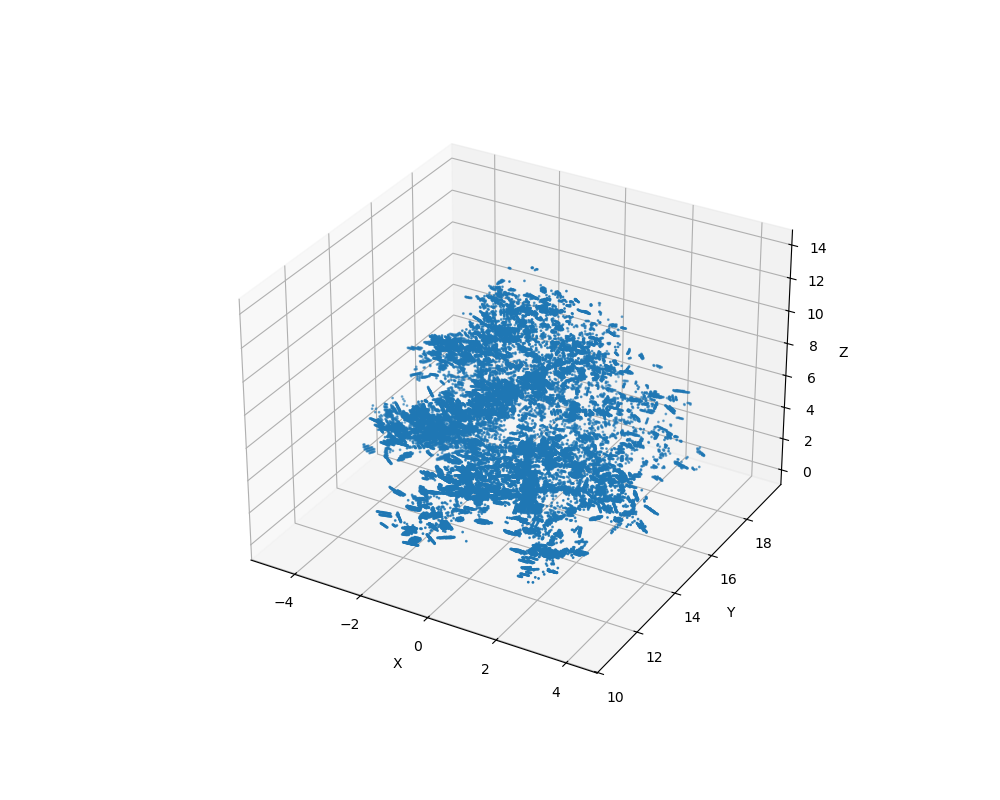

In [5]:
# remove all z_points below 0.02
z_threshold = 0.05
filtered_points = point_clouds[point_clouds[:,2] > z_threshold]
print(f"Points after removing ground level: {filtered_points.shape[0]}")    
# plot filtered point clouds
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(filtered_points[:,0], filtered_points[:,1], filtered_points[:,2], s=1)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.show()

# Keep only the tree half which faces the LiDAR scanner

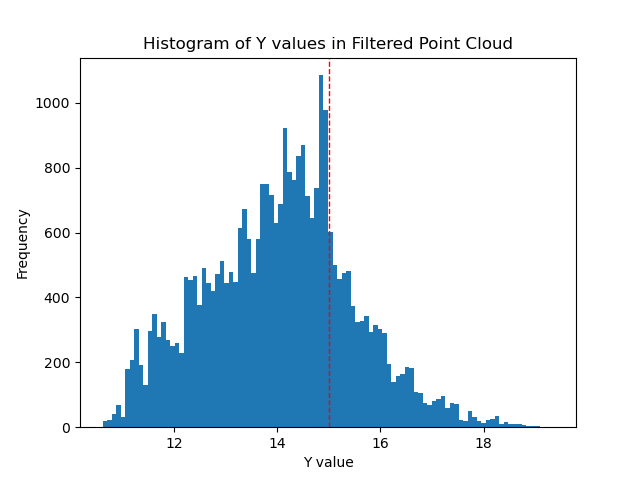

In [6]:
# plot histogram on Y values 
fig = plt.figure()
plt.hist(filtered_points[:,1], bins=100)
# plot mode
mode_y = 15
plt.axvline(mode_y, color='r', linestyle='dashed', linewidth=1)
plt.xlabel('Y value')
plt.ylabel('Frequency')
plt.title('Histogram of Y values in Filtered Point Cloud')
plt.show()

Points after removing high Y values: 25033


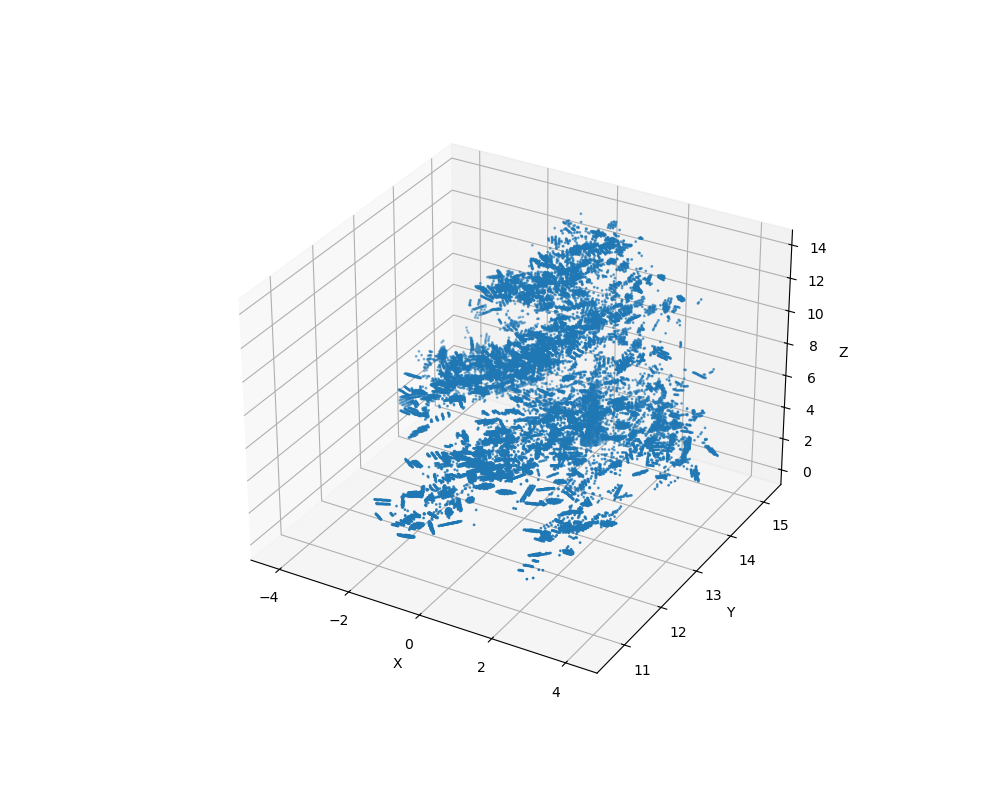

In [7]:
# filter out all points with y > mode_y
y_threshold = mode_y + 0.2 # add some margin in case some leaves get cut off
filtered_points = filtered_points[filtered_points[:,1] < y_threshold]
print(f"Points after removing high Y values: {filtered_points.shape[0]}")    
# plot final point clouds
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(filtered_points[:,0], filtered_points[:,1], filtered_points[:,2], s=1)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.show()

Points after down sampling: 25033


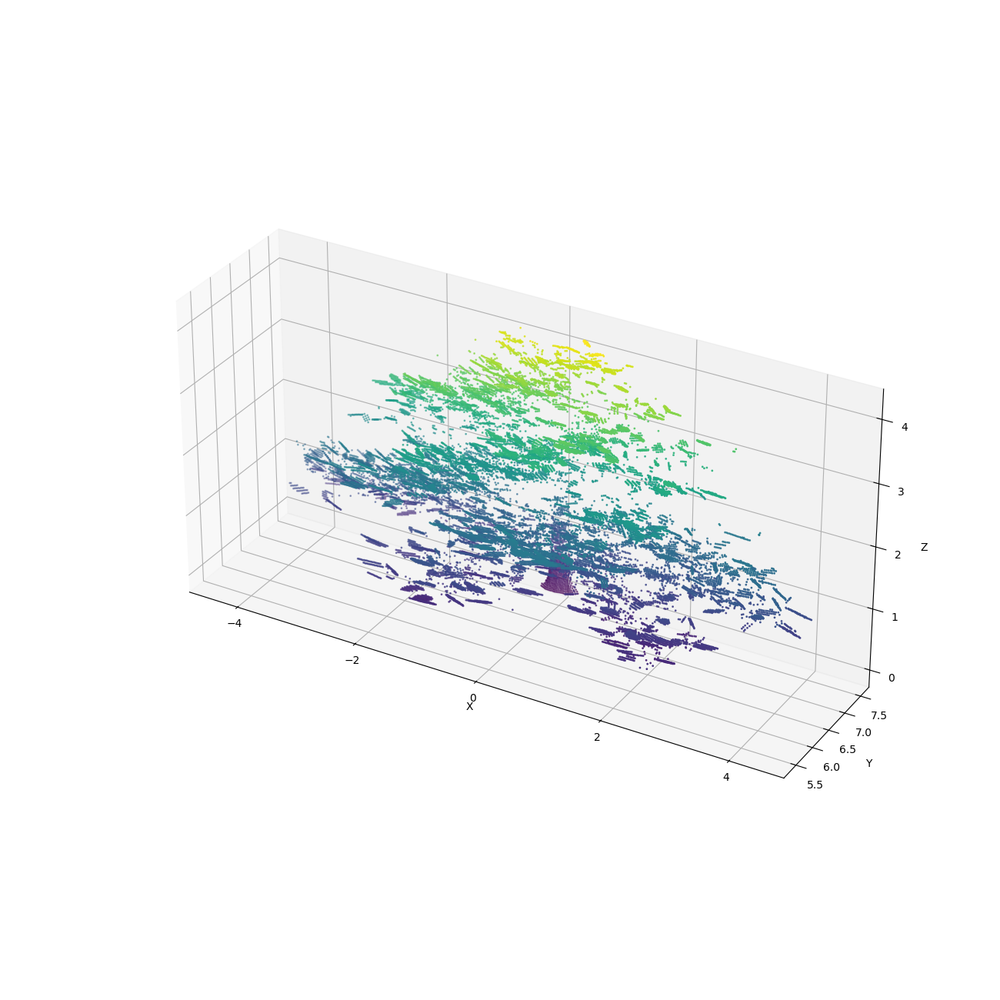

In [44]:
# down sampling the point clouds for faster processing
sample_ratio = 1  # keep 100% of points
num_points = filtered_points.shape[0]
sampled_indices = np.random.choice(num_points, size=int(num_points * sample_ratio), replace=False)
sampled_points = filtered_points[sampled_indices]

# compress the y values by 0.5 to make the point clouds denser in y direction
sampled_points[:,1] = sampled_points[:,1] * 0.5
# compress the z values by 0.7 to make the point clouds denser in z direction
sampled_points[:,2] = sampled_points[:,2] * 0.3

print(f"Points after down sampling: {sampled_points.shape[0]}")
# plot down sampled point clouds
fig = plt.figure(figsize=(13,13))
ax = fig.add_subplot(111, projection='3d')
# color by z value
sc = ax.scatter(sampled_points[:,0], sampled_points[:,1], sampled_points[:,2], c=sampled_points[:,2], cmap='viridis', s=1)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
# make all axes the same scale
ax.set_aspect('equal', adjustable='box')
# plt.colorbar(sc, ax=ax, label='Z value', shrink=0.3)
plt.show()

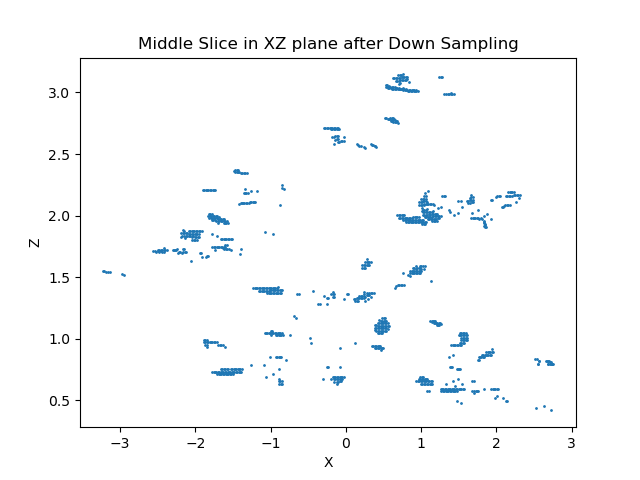

In [45]:
# check a slice in the middle
y_middle = (np.min(sampled_points[:,1]) + np.max(sampled_points[:,1])) / 2
slice_thickness = 0.1
middle_slice = sampled_points[(sampled_points[:,1] >= y_middle - slice_thickness/2) & (sampled_points[:,1] < y_middle + slice_thickness/2)]
plt.figure()
plt.scatter(middle_slice[:,0], middle_slice[:,2], s=1)
plt.title('Middle Slice in XZ plane after Down Sampling')
plt.xlabel('X')
plt.ylabel('Z')
plt.show()

# the slice looks good, the distance of points between the z and x direction are comparable now.

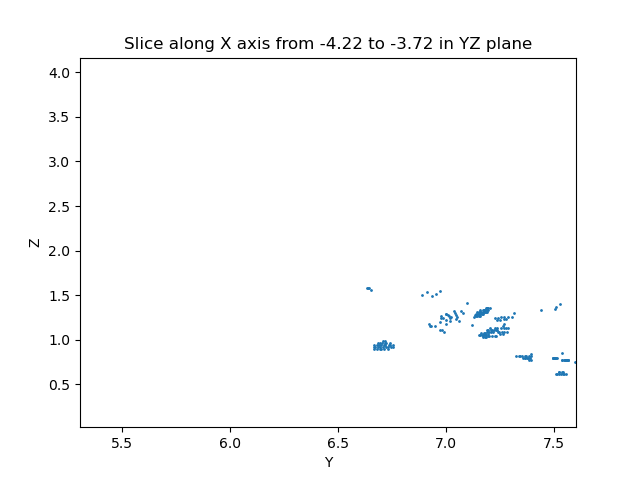

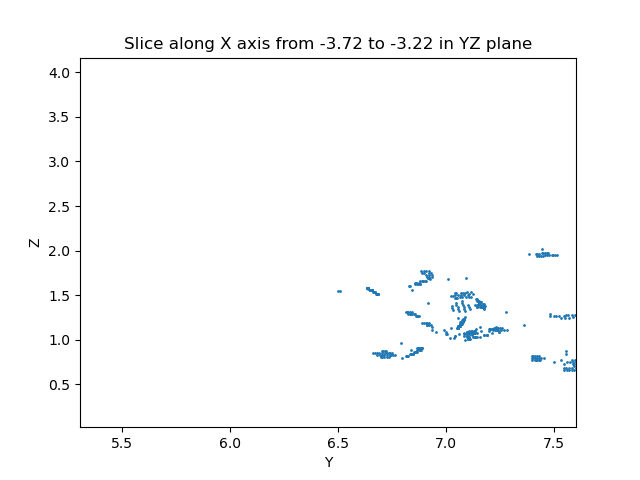

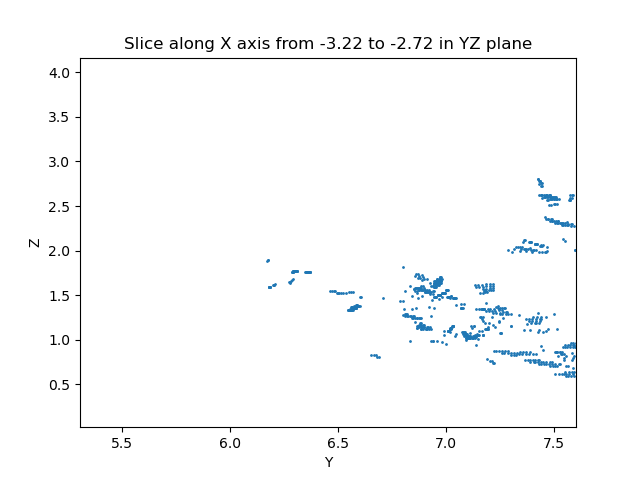

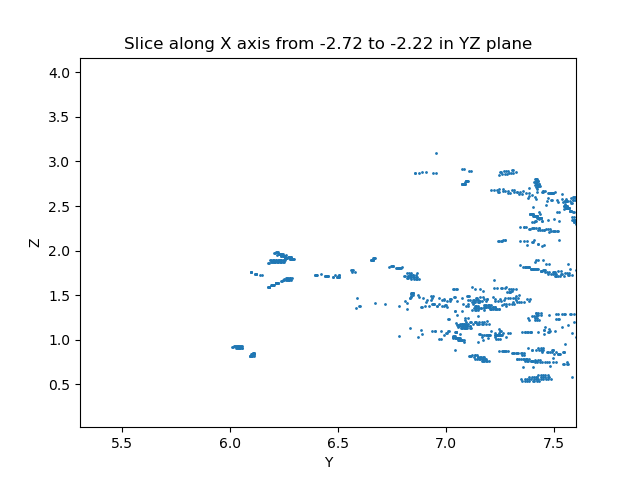

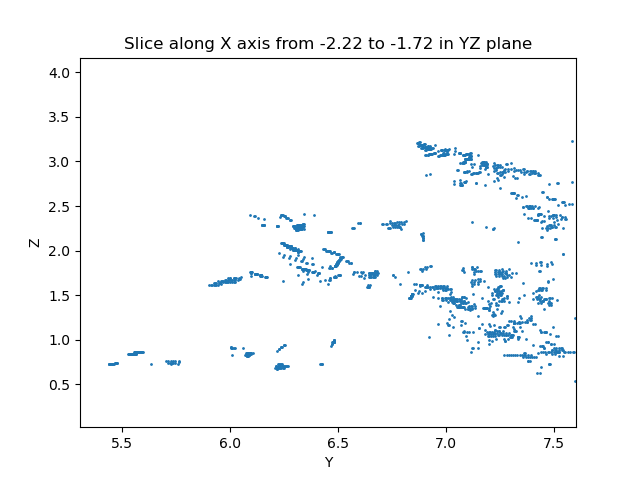

...

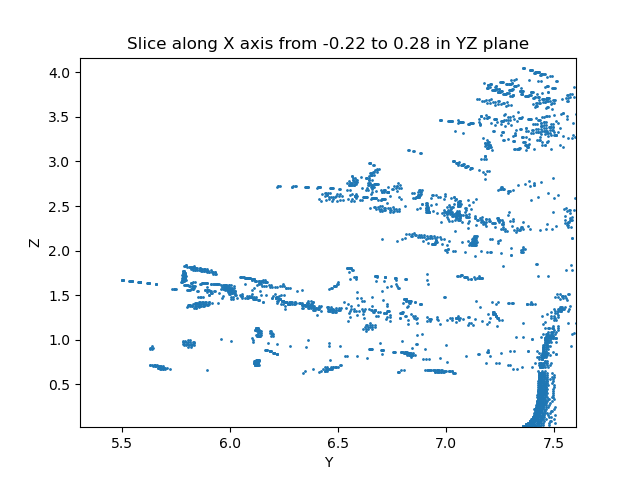

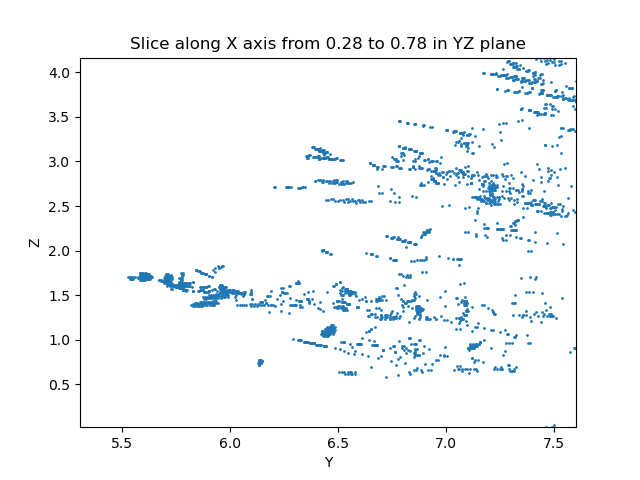

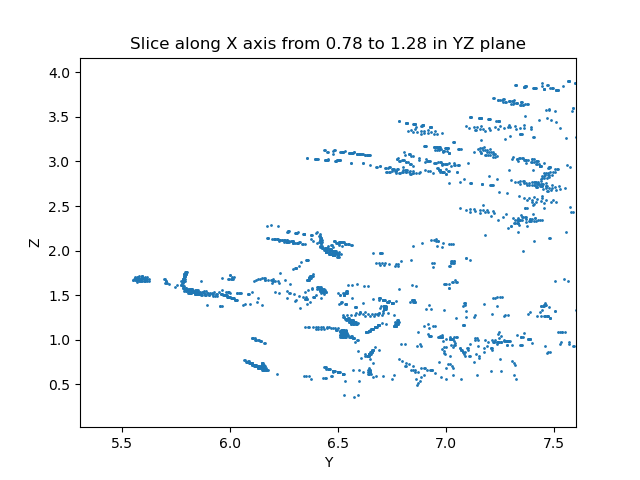

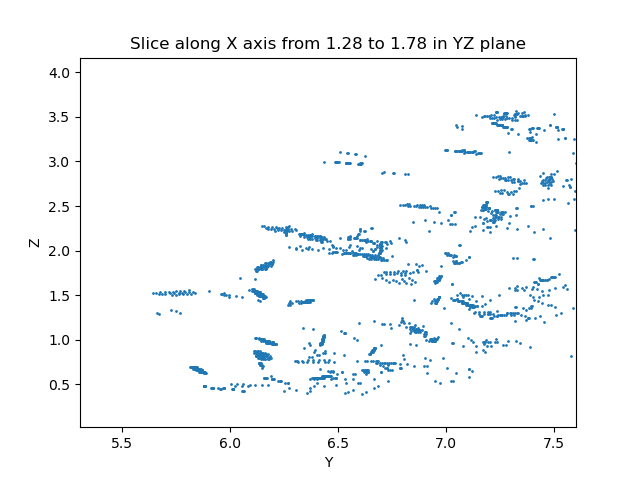

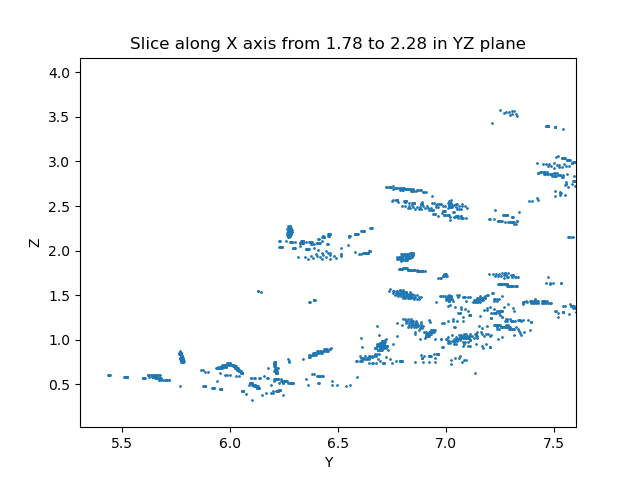

/tmp/ipykernel_291152/2072953540.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


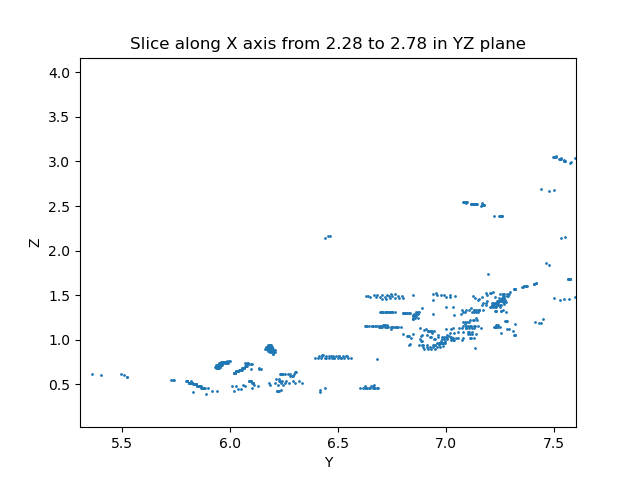

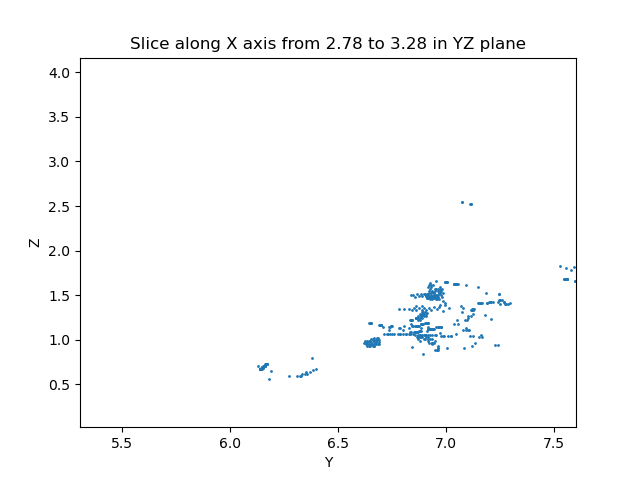

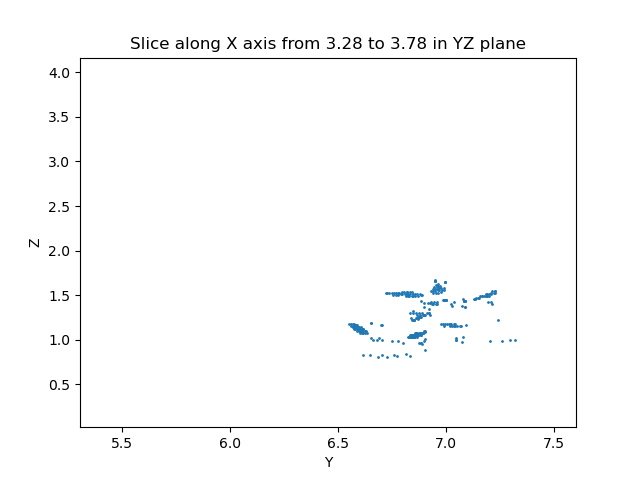

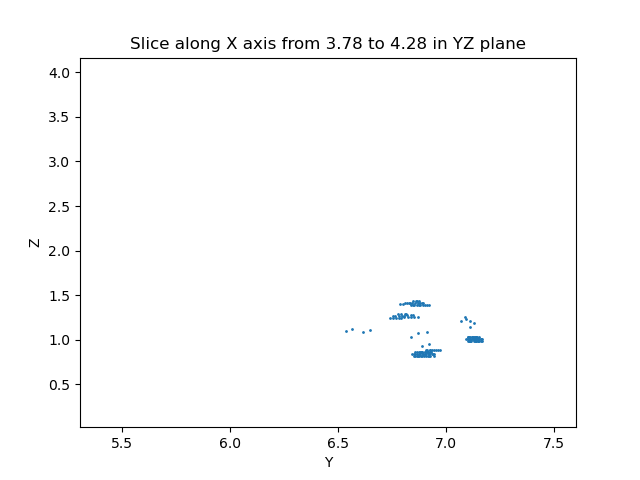

In [13]:
# show some slices along the x axis
x_min = np.min(sampled_points[:,0])
x_max = np.max(sampled_points[:,0])
slice_thickness = 0.5
x = x_min
while x < x_max:
    slice_points = sampled_points[(sampled_points[:,0] >= x) & (sampled_points[:,0] < x + slice_thickness)]
    plt.figure()
    plt.scatter(slice_points[:,1], slice_points[:,2], s=1)
    plt.title(f'Slice along X axis from {x:.2f} to {x + slice_thickness:.2f} in YZ plane')
    plt.xlabel('Y')
    plt.ylabel('Z')
    plt.xlim(np.min(sampled_points[:,1]), np.max(sampled_points[:,1]))
    plt.ylim(np.min(sampled_points[:,2]), np.max(sampled_points[:,2]))
    plt.show()
    x += slice_thickness
# we can see that it does well in some areas, but in some areas, leaves are still merged together or cut into different clusters.
# this is because

# Use DBSCAN to find leaf clusters

We can see that the distance between points are not uniform across the tree. It is affected by:
1. The distance from the LiDAR scanner to the leaf surface.
2. The angle between the leaf surface normal and the direction from the LiDAR scanner to the leaf surface.

DBSCAN requires a fixed distance threshold (eps) to cluster points. Therefore, we will cut the tree into smaller clusters first, then apply DBSCAN on each smaller cluster with an appropriate eps value.

In [14]:
# use DBSCAN to create clusters of points (branches and leaves)
from sklearn.cluster import DBSCAN

In [ ]:
# analyze the shape of clusters, we want the shape that characterize leaves best
from sklearn.decomposition import PCA

def analyze_cluster_shape(points):
    """Analyze the shape of a cluster of points using PCA."""
    if points.shape[0] < 3:
        return 0.0, 0.0, 0.0  # not enough points to analyze shape
    
    # get linearality, planarity, sphericity
    pca = PCA(n_components=3)
    pca.fit(points)
    eigenvalues = pca.explained_variance_
    total_variance = np.sum(eigenvalues)
    linearity = (eigenvalues[0] - eigenvalues[1]) / total_variance
    planarity = (eigenvalues[1] - eigenvalues[2]) / total_variance
    sphericity = eigenvalues[2] / total_variance
    return linearity, planarity, sphericity

def get_geometric_statistics(points, labels):
    list_shapes = []
    list_cluster_labels = []
    for cluster_label in set(labels):
        if cluster_label == -1:
            continue  # skip noise
        cluster_points = points[labels == cluster_label]
        linearity, planarity, sphericity = analyze_cluster_shape(cluster_points)
        list_shapes.append((linearity, planarity, sphericity))
        list_cluster_labels.append(cluster_label)
        
    # compute average shape statistics
    avg_linearity = np.sum([shape[0] for shape in list_shapes])
    avg_planarity = np.sum([shape[1] for shape in list_shapes])
    avg_sphericity = np.sum([shape[2] for shape in list_shapes])
    return avg_linearity, avg_planarity, avg_sphericity, list_shapes, list_cluster_labels

## Clustering the tree into smaller clusters

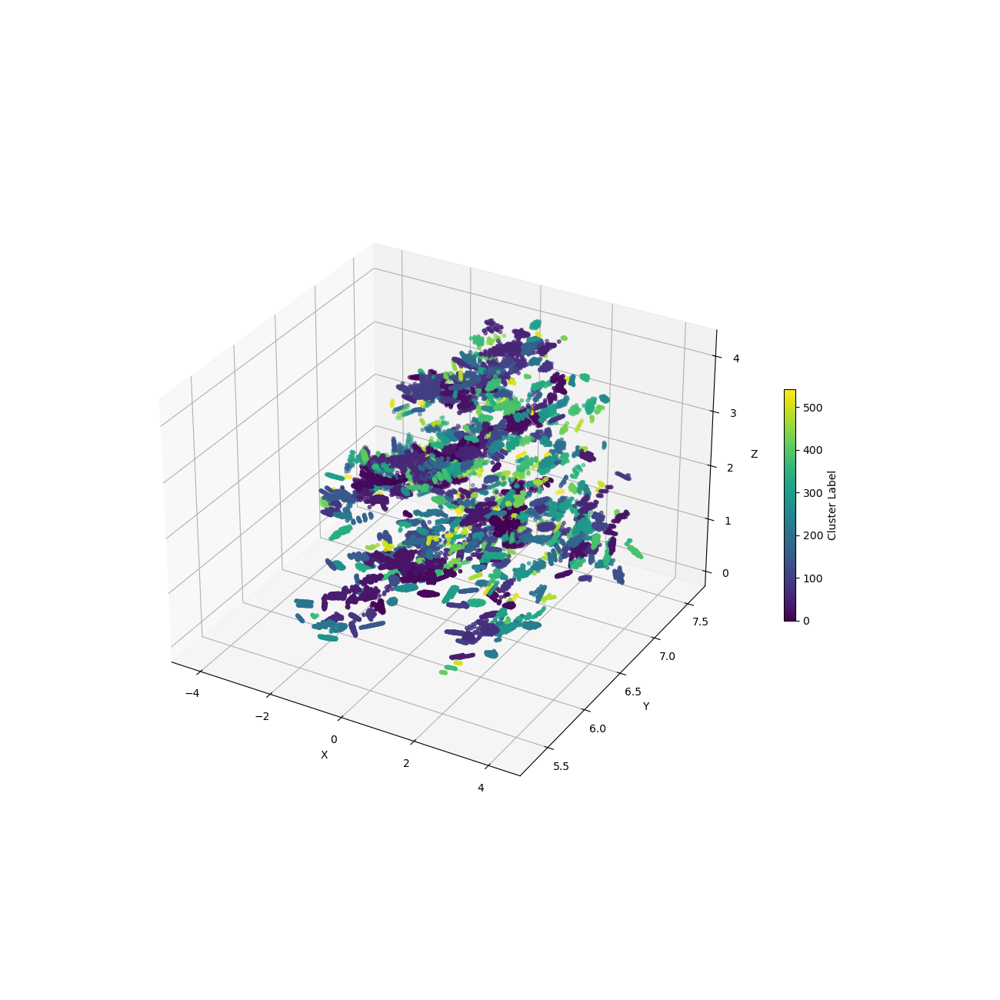

In [24]:
# initial cluster
y_scale = 1
scaled_points = sampled_points.copy()
scaled_points[:,1] = scaled_points[:,1] * y_scale
eps = 0.07
dbscan = DBSCAN(eps=eps, min_samples=5, n_jobs=14)
labels = dbscan.fit_predict(scaled_points)
num_clusters = len(set(labels)) - (1 if -1 in labels else 0)

# plot clusters with different colors
fig = plt.figure(figsize=(13,13))
ax = fig.add_subplot(111, projection='3d')  
# remove points which belong to no cluster (label = -1)
valid_indices = labels != -1
sampled_points_plot = scaled_points[valid_indices]
labels_plot = labels[valid_indices] 
sc = ax.scatter(sampled_points_plot[:,0], sampled_points_plot[:,1], sampled_points_plot[:,2], c=labels_plot, cmap='viridis', s=10)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.colorbar(sc, ax=ax, label='Cluster Label', shrink=0.3)
plt.show()

In [25]:
# for each large cluster, find the best y_scale, z_scale to maximize the number of leaf-like clusters

# leaf-like clusters are defined as clusters with size between 20 and 60 points, and planarity > linearity and sphericity
def score_function(points, labels):
    list_shapes = []
    cluster_id_2_stats = {}
    for cluster_label in set(labels):
        if cluster_label == -1:
            continue  # skip noise
        cluster_points = points[labels == cluster_label]
        if cluster_points.shape[0] < 15 or cluster_points.shape[0] > 80:
            continue  # skip too small or too large clusters
        linearity, planarity, sphericity = analyze_cluster_shape(cluster_points)
        list_shapes.append((linearity, planarity, sphericity))
        ratio = planarity / (sphericity + 1e-7)
        if ratio > 20:  # leaf-like cluster
            cluster_id_2_stats[cluster_label] = (linearity, planarity, sphericity)
        
    # score is planarity * number of points in each leaf-like cluster
    score = 0
    for cluster_label, stats in cluster_id_2_stats.items():
        planarity = stats[1]
        num_points = np.sum(labels == cluster_label)
        score += num_points
    return score, cluster_id_2_stats

def optimize_scales_for_cluster(cluster_points):
    best_y_scale = 1.0
    best_z_scale = 1.0
    best_score = -1
    best_num_leaf_clusters = 0
    list_y_scale = np.arange(0.5, 2.0, 0.1)
    list_z_scale = np.arange(0.5, 2.0, 0.1)
    
    for y_scale in list_y_scale:
        for z_scale in list_z_scale:
            scaled_points = cluster_points.copy()
            scaled_points[:,1] = scaled_points[:,1] * y_scale
            scaled_points[:,2] = scaled_points[:,2] * z_scale
            
            dbscan = DBSCAN(eps=0.05, min_samples=5, n_jobs=16)
            labels = dbscan.fit_predict(scaled_points)
            
            # the number of points in -1 cluster should be less than 20% of total points
            num_noise_points = np.sum(labels == -1)
            if num_noise_points > 0.2 * scaled_points.shape[0]:
                continue  # skip this scale
            
            score, cluster_id_2_stats = score_function(scaled_points, labels)
            
            if score > best_score or (np.abs(score - best_score) <= 3 and len(cluster_id_2_stats) > best_num_leaf_clusters):
                best_score = score
                best_y_scale = y_scale
                best_z_scale = z_scale
                best_num_leaf_clusters = len(cluster_id_2_stats)
                
    return best_y_scale, best_z_scale, best_score, best_num_leaf_clusters

## For each smaller cluster, find leaf clusters using DBSCAN and shape analysis

In [26]:
cluster_id_2_best_scales = {}

In [27]:
for cluster_label in set(labels):
    if cluster_label in cluster_id_2_best_scales:
        continue  # already processed
    
    if cluster_label == -1:
        continue  # skip noise
    cluster_points = scaled_points[labels == cluster_label]
    # if cluster_points.shape[0] < 100:
    #     continue  # skip small clusters
    
    best_y_scale, best_z_scale, best_score, best_num_leaf_clusters = optimize_scales_for_cluster(cluster_points)
    print(f"Cluster {cluster_label}: Best Y scale: {best_y_scale:.2f}, Best Z scale: {best_z_scale:.2f}, Best Score (leaf-like clusters): {best_score}, Number of leaf-like clusters: {best_num_leaf_clusters}")
    cluster_id_2_best_scales[cluster_label] = (best_y_scale, best_z_scale, best_score, best_num_leaf_clusters)
    
    # # for debugging, plot the best clustering result
    # coin_toss = np.random.rand()
    # if coin_toss > 0:
    #     continue  # only plot some clusters to save time
    
    #  # plot clusters with different colors
    # large_cluster = cluster_points.copy()
    # large_cluster[:,1] = large_cluster[:,1] * best_y_scale
    # large_cluster[:,2] = large_cluster[:,2] * best_z_scale 
    # sub_dbscan = DBSCAN(eps=0.05, min_samples=5, n_jobs=14)
    # sub_labels = sub_dbscan.fit_predict(large_cluster)
    
    # fig = plt.figure(figsize=(10,10))
    # ax = fig.add_subplot(111, projection='3d')
    # valid_indices = sub_labels != -1
    # sampled_points_plot = large_cluster[valid_indices]
    # labels_plot = sub_labels[valid_indices]
    # sc = ax.scatter(sampled_points_plot[:,0], sampled_points_plot[:,1], sampled_points_plot[:,2], c=labels_plot, cmap='viridis', s=10)
    # ax.set_xlabel('X')
    # ax.set_ylabel('Y')
    # ax.set_zlabel('Z')
    # # plot true scale 
    # ax.set_aspect('equal', adjustable='box')
    # plt.tight_layout()
    # plt.show()

Cluster 0: Best Y scale: 0.60, Best Z scale: 1.20, Best Score (leaf-like clusters): 135, Number of leaf-like clusters: 3
Cluster 1: Best Y scale: 0.50, Best Z scale: 1.10, Best Score (leaf-like clusters): 62, Number of leaf-like clusters: 2
Cluster 2: Best Y scale: 0.50, Best Z scale: 0.90, Best Score (leaf-like clusters): 25, Number of leaf-like clusters: 1
Cluster 3: Best Y scale: 0.50, Best Z scale: 1.60, Best Score (leaf-like clusters): 20, Number of leaf-like clusters: 1
Cluster 4: Best Y scale: 1.00, Best Z scale: 0.80, Best Score (leaf-like clusters): 37, Number of leaf-like clusters: 1
Cluster 5: Best Y scale: 0.70, Best Z scale: 1.00, Best Score (leaf-like clusters): 51, Number of leaf-like clusters: 2
Cluster 6: Best Y scale: 1.20, Best Z scale: 1.80, Best Score (leaf-like clusters): 97, Number of leaf-like clusters: 2
Cluster 7: Best Y scale: 1.40, Best Z scale: 1.80, Best Score (leaf-like clusters): 101, Number of leaf-like clusters: 4
Cluster 8: Best Y scale: 0.50, Best Z 

Cluster 241: Best Y scale: 0.80, Best Z scale: 0.50, Best Score (leaf-like clusters): 30, Number of leaf-like clusters: 1


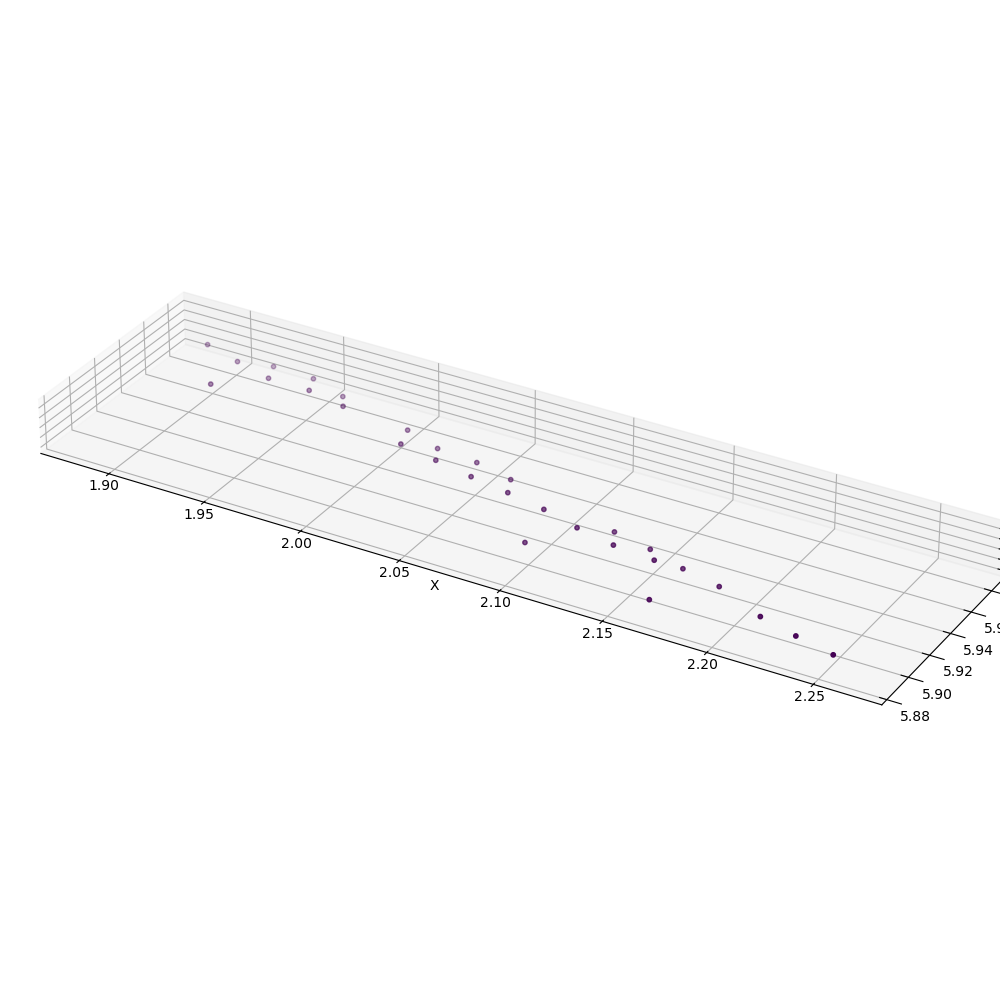

Cluster 13: Best Y scale: 0.90, Best Z scale: 0.50, Best Score (leaf-like clusters): 55, Number of leaf-like clusters: 1


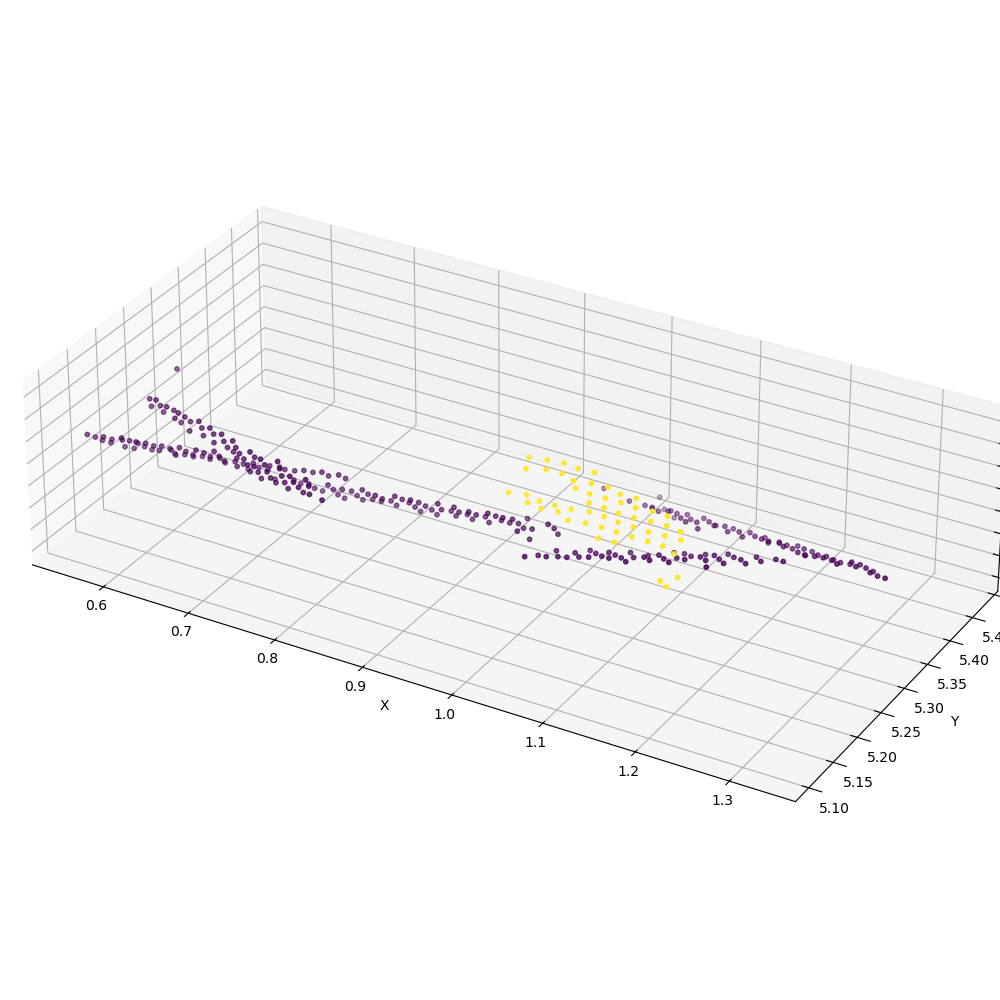

Cluster 82: Best Y scale: 0.70, Best Z scale: 0.80, Best Score (leaf-like clusters): 38, Number of leaf-like clusters: 1


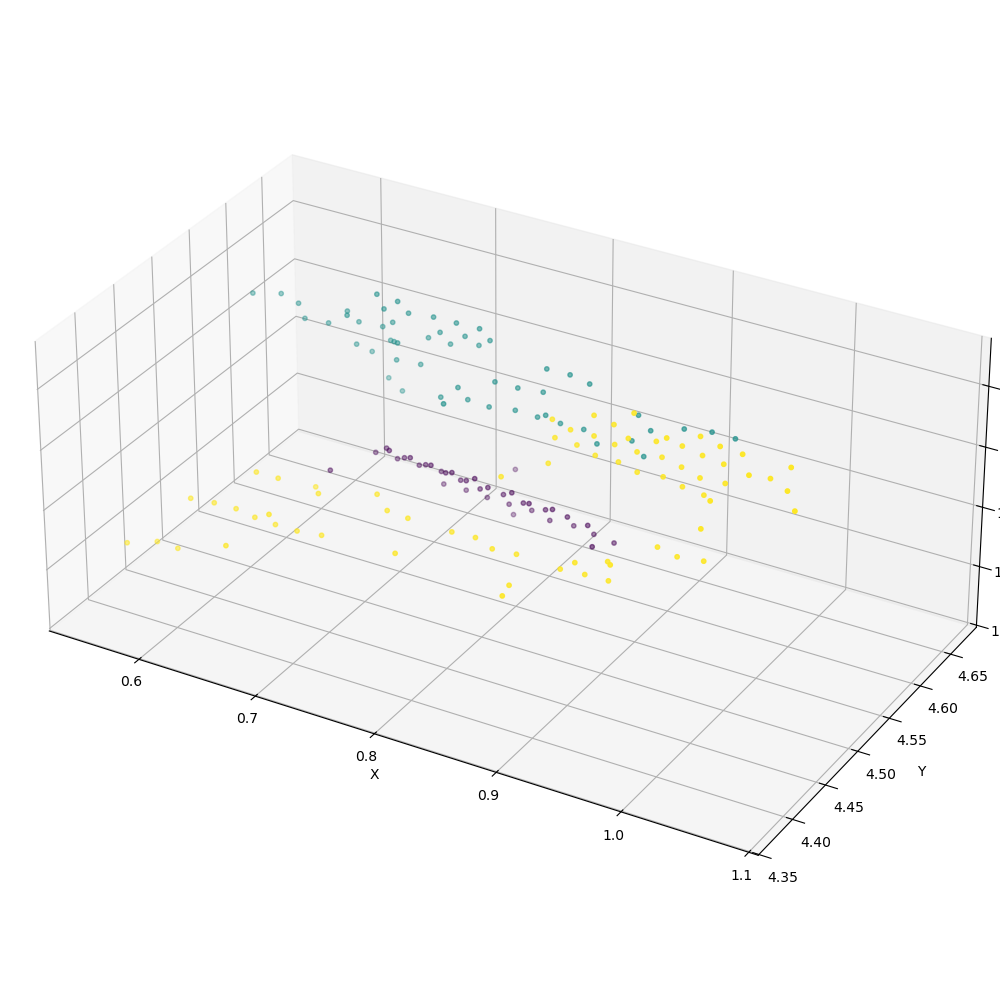

Cluster 41: Best Y scale: 0.50, Best Z scale: 0.50, Best Score (leaf-like clusters): 62, Number of leaf-like clusters: 1


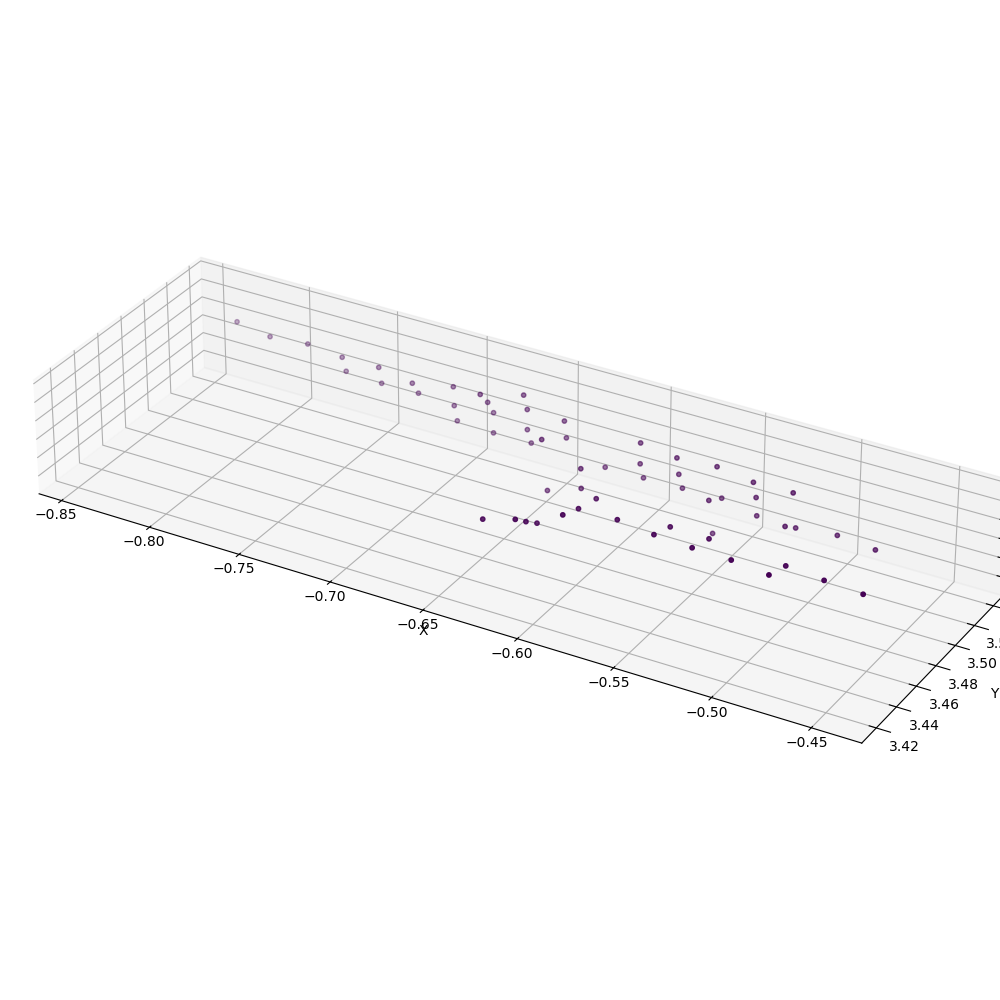

Cluster 30: Best Y scale: 1.90, Best Z scale: 1.30, Best Score (leaf-like clusters): 97, Number of leaf-like clusters: 2


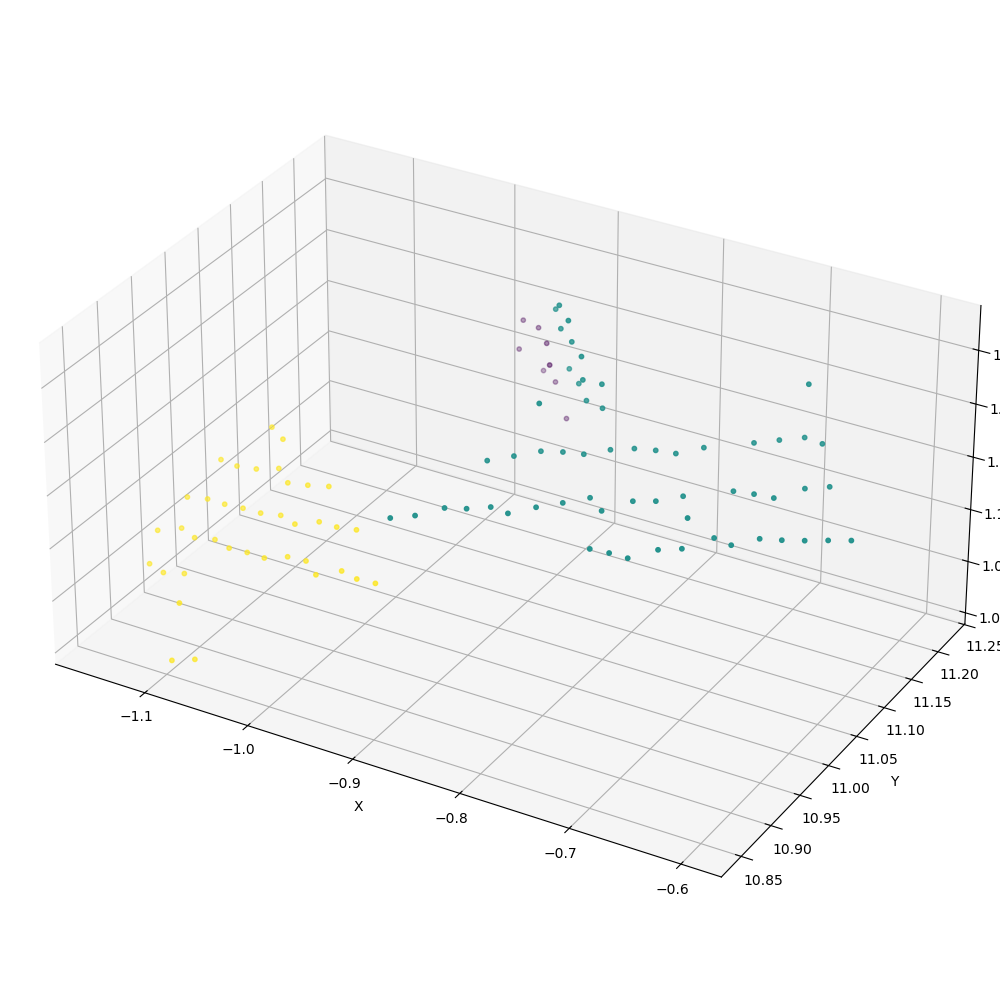

In [30]:
# plot some random clusters with their best scales
for cluster_label in np.random.choice(list(cluster_id_2_best_scales.keys()), size=5, replace=False):
    best_y_scale, best_z_scale, best_score, best_num_leaf_clusters = cluster_id_2_best_scales[cluster_label]
    print(f"Cluster {cluster_label}: Best Y scale: {best_y_scale:.2f}, Best Z scale: {best_z_scale:.2f}, Best Score (leaf-like clusters): {best_score}, Number of leaf-like clusters: {best_num_leaf_clusters}")
    cluster_points = scaled_points[labels == cluster_label]
    
    # plot clusters with different colors
    large_cluster = cluster_points.copy()
    large_cluster[:,1] = large_cluster[:,1] * best_y_scale
    large_cluster[:,2] = large_cluster[:,2] * best_z_scale 
    sub_dbscan = DBSCAN(eps=0.05, min_samples=5, n_jobs=16)
    sub_labels = sub_dbscan.fit_predict(large_cluster)
    
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(111, projection='3d')
    valid_indices = sub_labels != -1
    sampled_points_plot = large_cluster[valid_indices]
    labels_plot = sub_labels[valid_indices]
    sc = ax.scatter(sampled_points_plot[:,0], sampled_points_plot[:,1], sampled_points_plot[:,2], c=labels_plot, cmap='viridis', s=10)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    # plot true scale 
    ax.set_aspect('equal', adjustable='box')
    plt.tight_layout()
    plt.show()

In [46]:
# # raise False
# assert False

In [ ]:
# dump cluster_id_2_best_scales to a file
# import pickle
# with open('cluster_id_2_best_scales_v5.pkl', 'wb') as f:
#     pickle.dump(cluster_id_2_best_scales, f)
    
# # dump all points and their cluster labels to a file
# import pandas as pd
# df = pd.DataFrame(scaled_points, columns=['X', 'Y', 'Z'])
# df['ClusterLabel'] = labels
# df.to_csv('scaled_points_with_clusters_v5.csv', index=False)

# # load cluster_id_2_best_scales from a file
# import pickle
# with open('cluster_id_2_best_scales_v5.pkl', 'rb') as f:
#     cluster_id_2_best_scales = pickle.load(f)
    
# # load all points and their cluster labels from a file
# import pandas as pd
# df = pd.read_csv('scaled_points_with_clusters_v5.csv')
# scaled_points = df[['X', 'Y', 'Z']].values
# labels = df['ClusterLabel'].values  

# Visualize the final result

In [35]:
# add sub-cluster labels to the main labels but origianl labels * 10 + sub-cluster labels
new_labels = labels.copy()
is_leaf_label = np.zeros_like(labels, dtype=bool)
for cluster_label in set(labels):
    if cluster_label == -1:
        continue  # skip noise
    cluster_points = scaled_points[labels == cluster_label]
    
    if cluster_label not in cluster_id_2_best_scales:
        continue  # skip clusters that were not processed
    best_y_scale, best_z_scale, best_score, best_num_leaf_clusters = cluster_id_2_best_scales[cluster_label]
    
    large_cluster = cluster_points.copy()
    large_cluster[:,1] = large_cluster[:,1] * best_y_scale
    large_cluster[:,2] = large_cluster[:,2] * best_z_scale 
    sub_dbscan = DBSCAN(eps=0.05, min_samples=5, n_jobs=14)
    sub_labels = sub_dbscan.fit_predict(large_cluster)
    
    for i, point in enumerate(cluster_points):
        global_index = np.where((scaled_points == point).all(axis=1))[0][0]
        if sub_labels[i] == -1:
            continue  # skip noise
        new_labels[global_index] = cluster_label * 10 + sub_labels[i]
        
        # check if this sub-cluster is leaf-like
        cluster_points_sub = large_cluster[sub_labels == sub_labels[i]]
        linearity, planarity, sphericity = analyze_cluster_shape(cluster_points_sub)
        ratio = planarity / (sphericity + 1e-7)
        if cluster_points_sub.shape[0] >= 15 and cluster_points_sub.shape[0] <= 80 and ratio > 20:
            is_leaf_label[global_index] = 1

In [36]:
unique_labels = np.unique(new_labels)
num_unique_labels = len(unique_labels) - (1 if -1 in unique_labels else 0)
# generate a random map between unique labels and colors
label_to_color = {}
for label in unique_labels:
    if label == -1:
        label_to_color[label] = (0, 0, 0)  # black for noise
    else:
        label_to_color[label] = np.random.rand(3,)

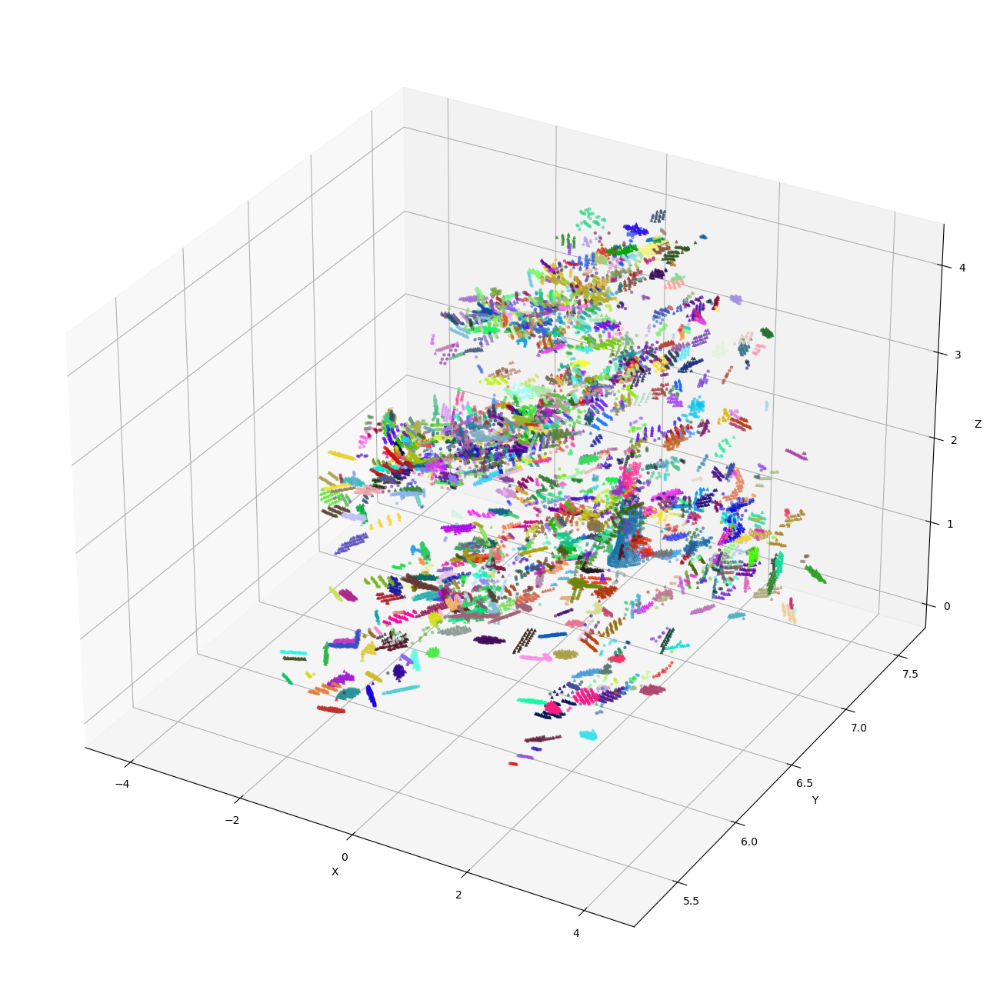

In [37]:
# plot tree using new labels
fig = plt.figure(figsize=(13,13))
ax = fig.add_subplot(111, projection='3d')  
# remove points which belong to no cluster (label = -1)
valid_indices = new_labels != -1
sampled_points_plot = scaled_points[valid_indices]
labels_plot = new_labels[valid_indices] 
colors_plot = np.array([label_to_color[label] for label in labels_plot])
# plot leaf points as triangles
leaf_indices = is_leaf_label[valid_indices]
non_leaf_indices = ~leaf_indices
ax.scatter(sampled_points_plot[non_leaf_indices,0], sampled_points_plot[non_leaf_indices,1], sampled_points_plot[non_leaf_indices,2], c=colors_plot[non_leaf_indices], s=5, alpha=0.5)
ax.scatter(sampled_points_plot[leaf_indices,0], sampled_points_plot[leaf_indices,1], sampled_points_plot[leaf_indices,2], c=colors_plot[leaf_indices], s=5, marker='^', alpha=0.7)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.tight_layout()
plt.show()

## Our estimation of number of leaves

In [47]:
# number of leaf clusters found is total number of num_leaf_cluster in cluster_id_2_best_scales
num_leaf = 0
for k, v in cluster_id_2_best_scales.items():
    num_leaf += v[3]
print(f"Estimated total number of leaves: {num_leaf*2}") # because we estimate on half of the point clouds

Estimated total number of leaves: 836


## CT scan along z-axis

Triangle points is for leaf clusters and circle points is for branch clusters.

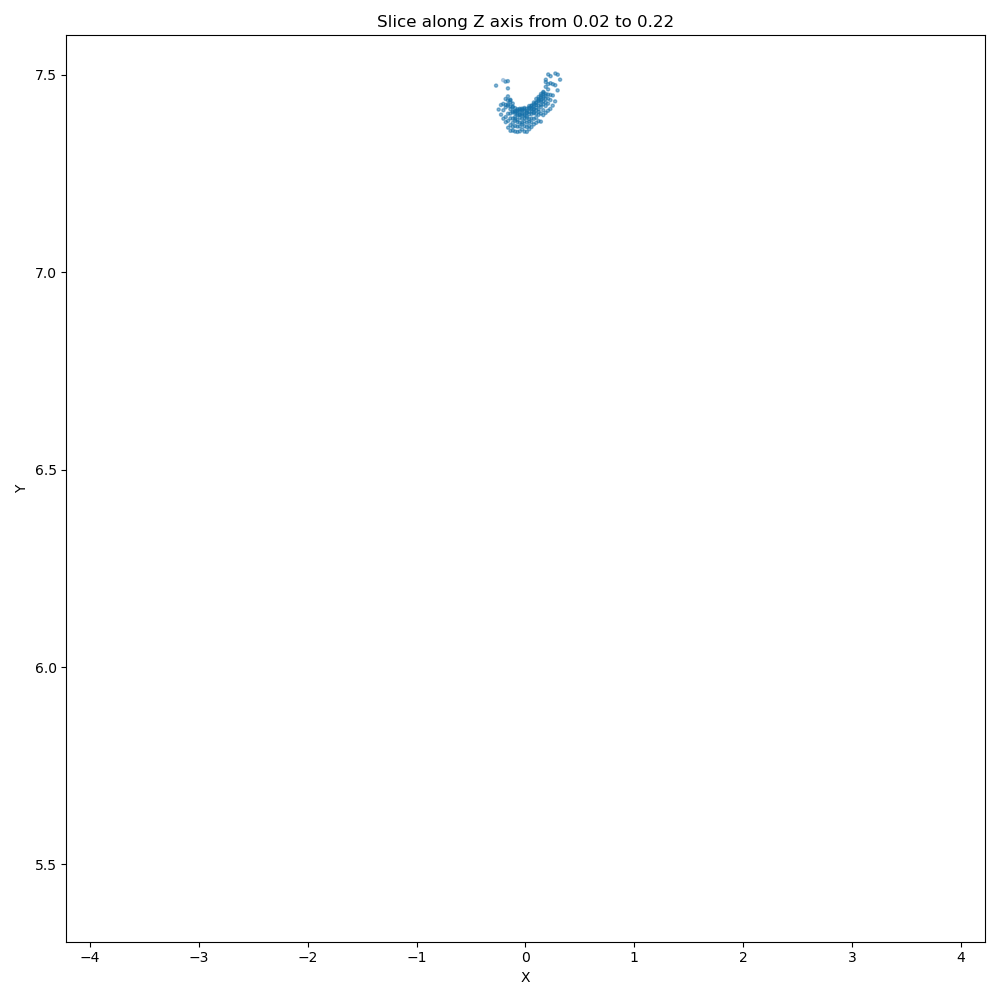

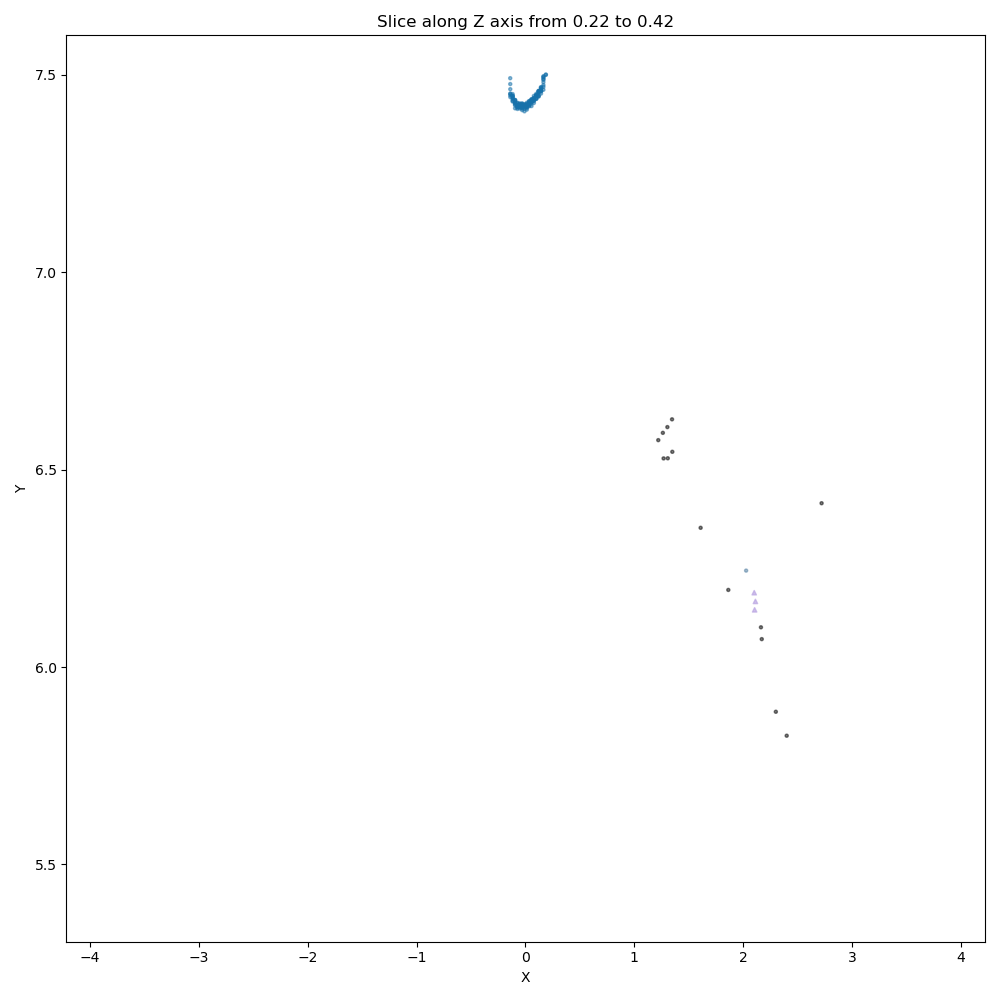

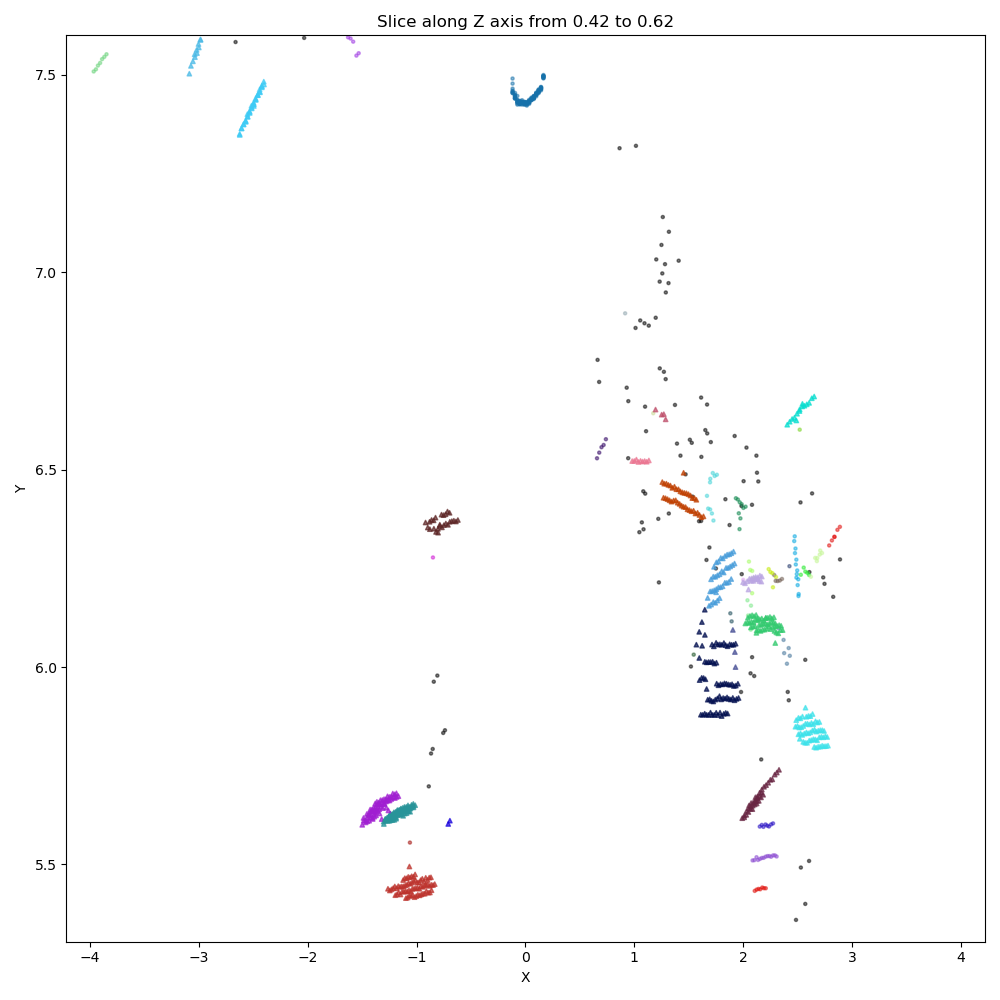

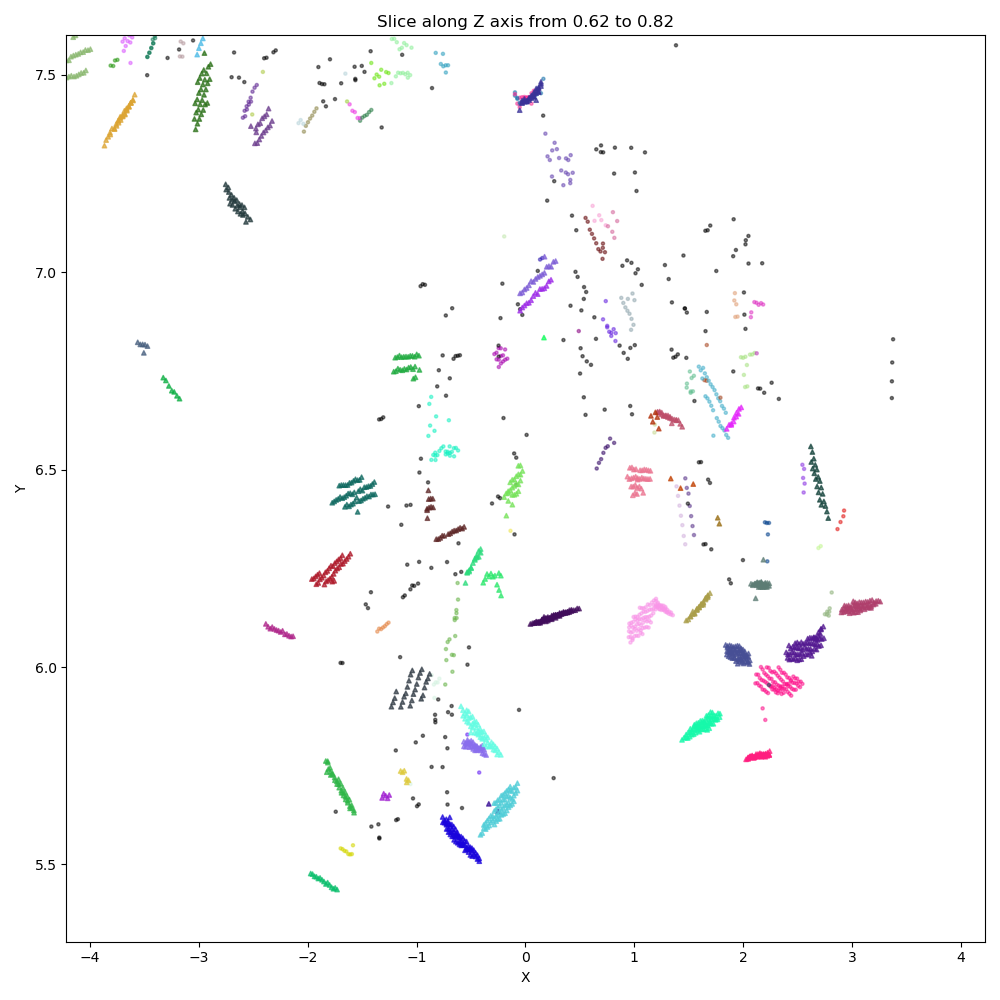

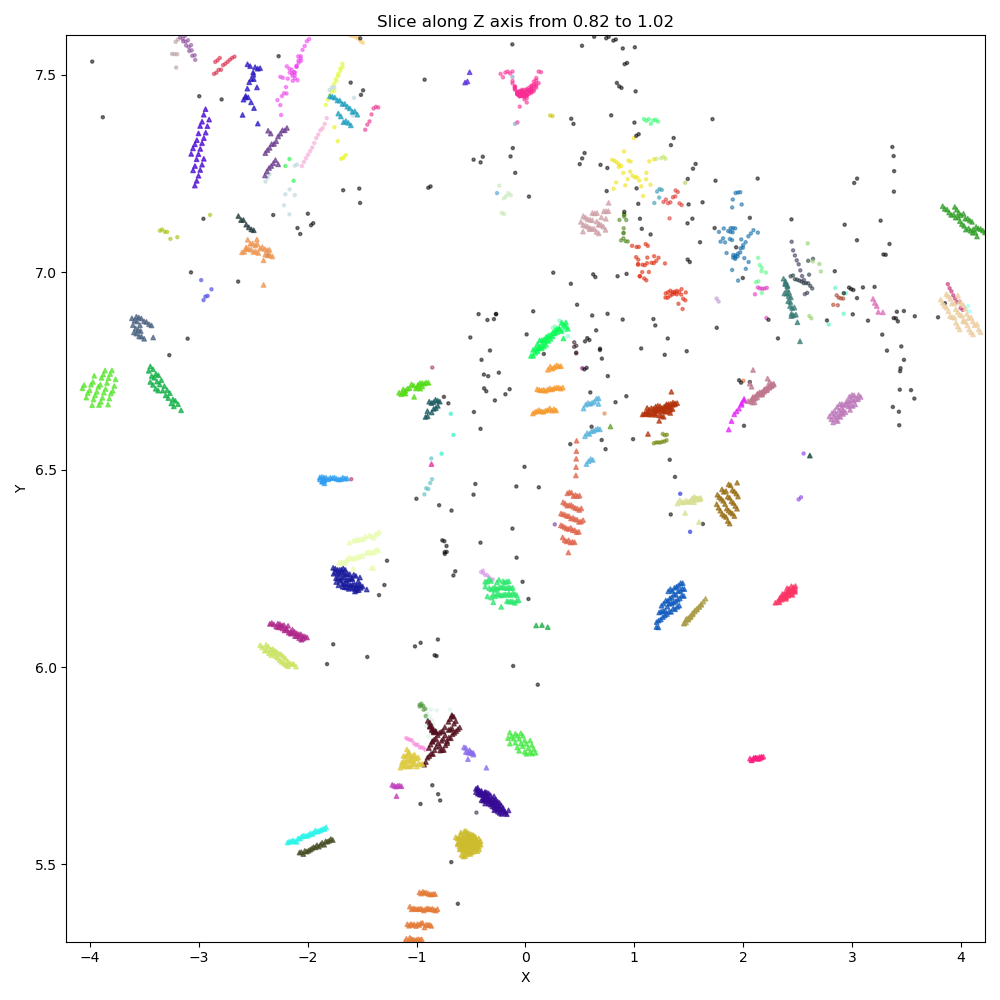

...

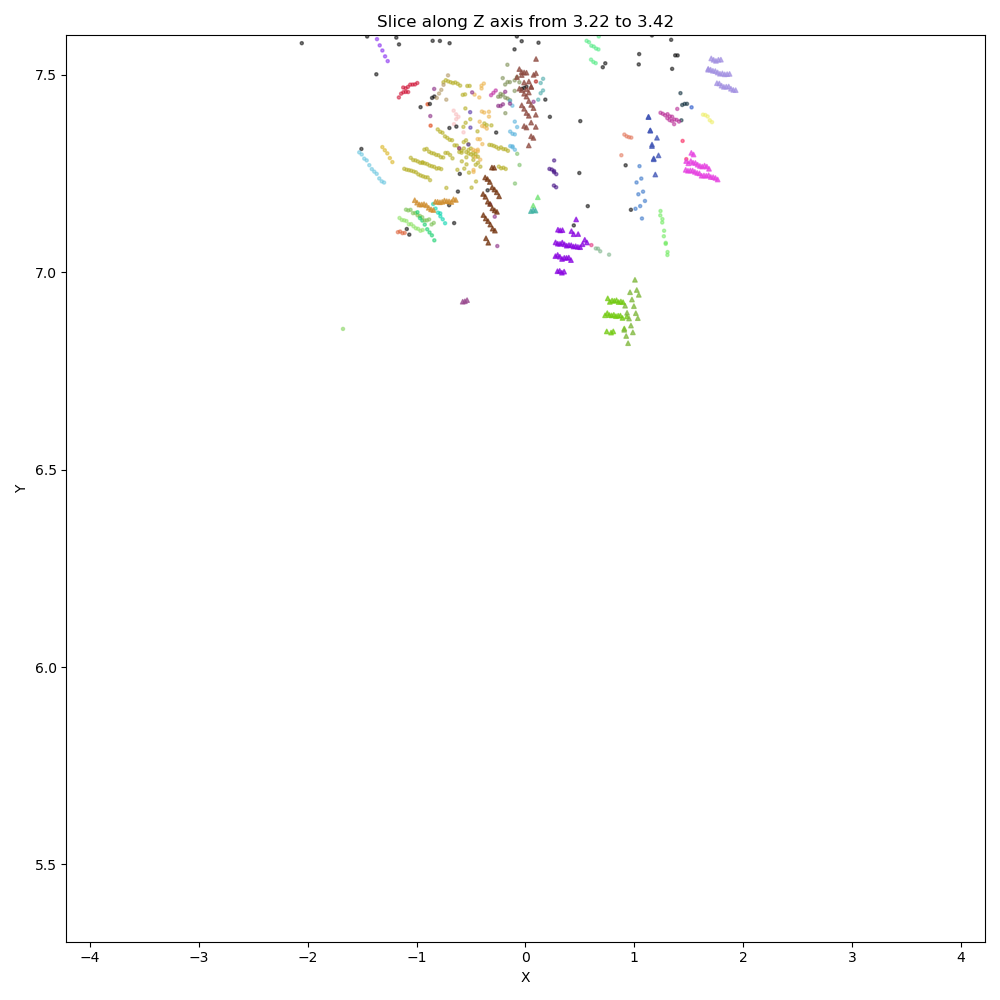

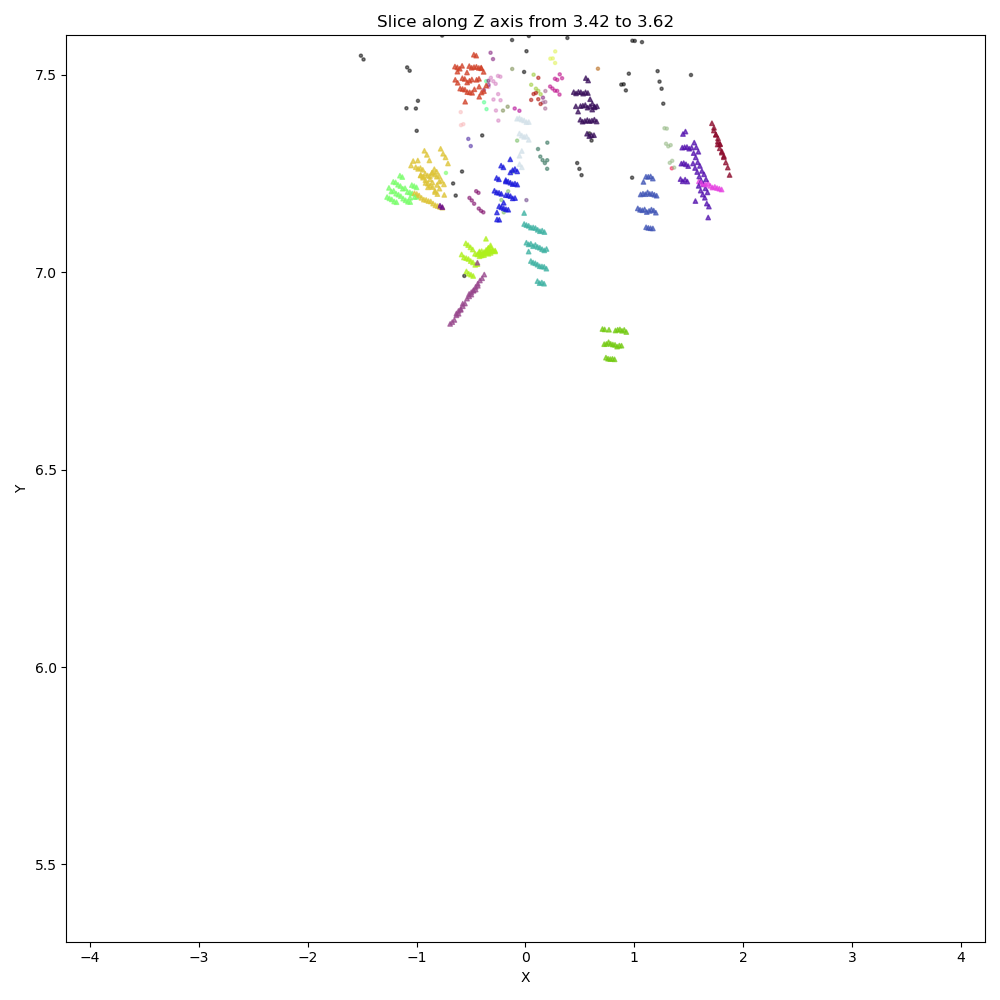

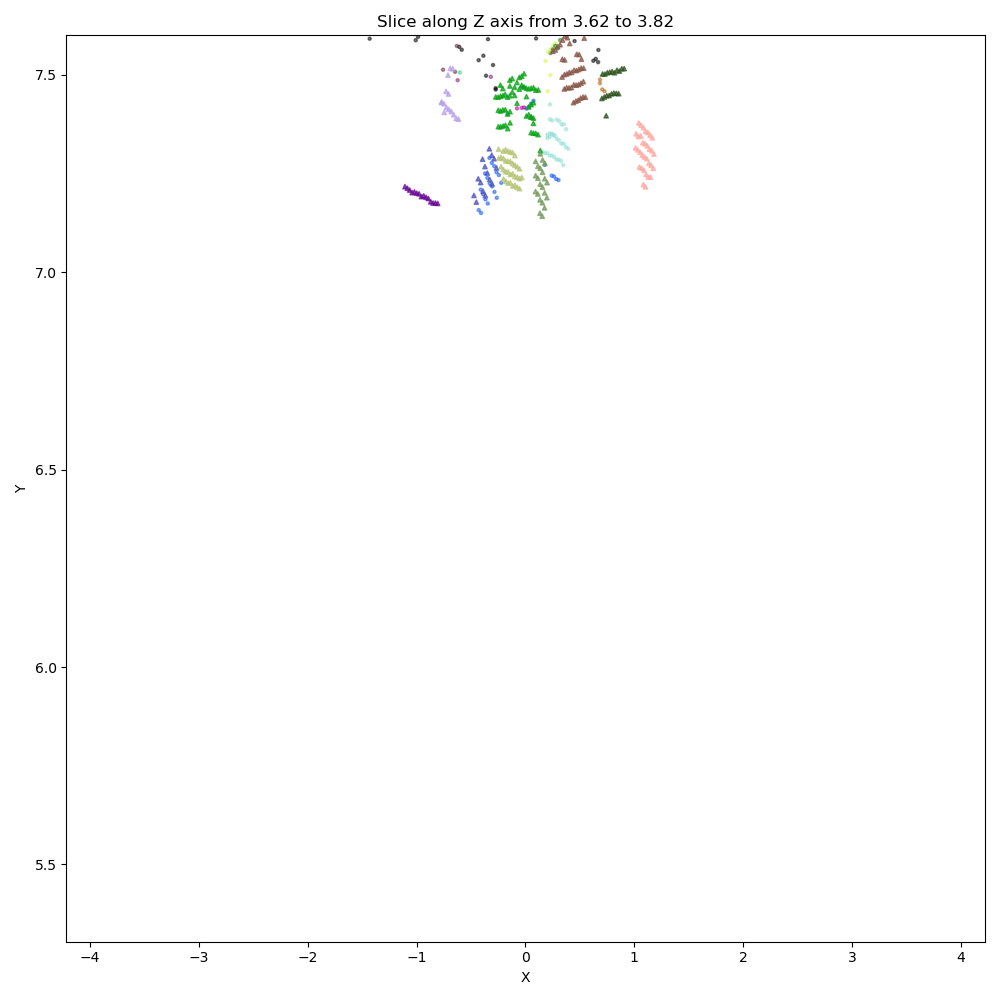

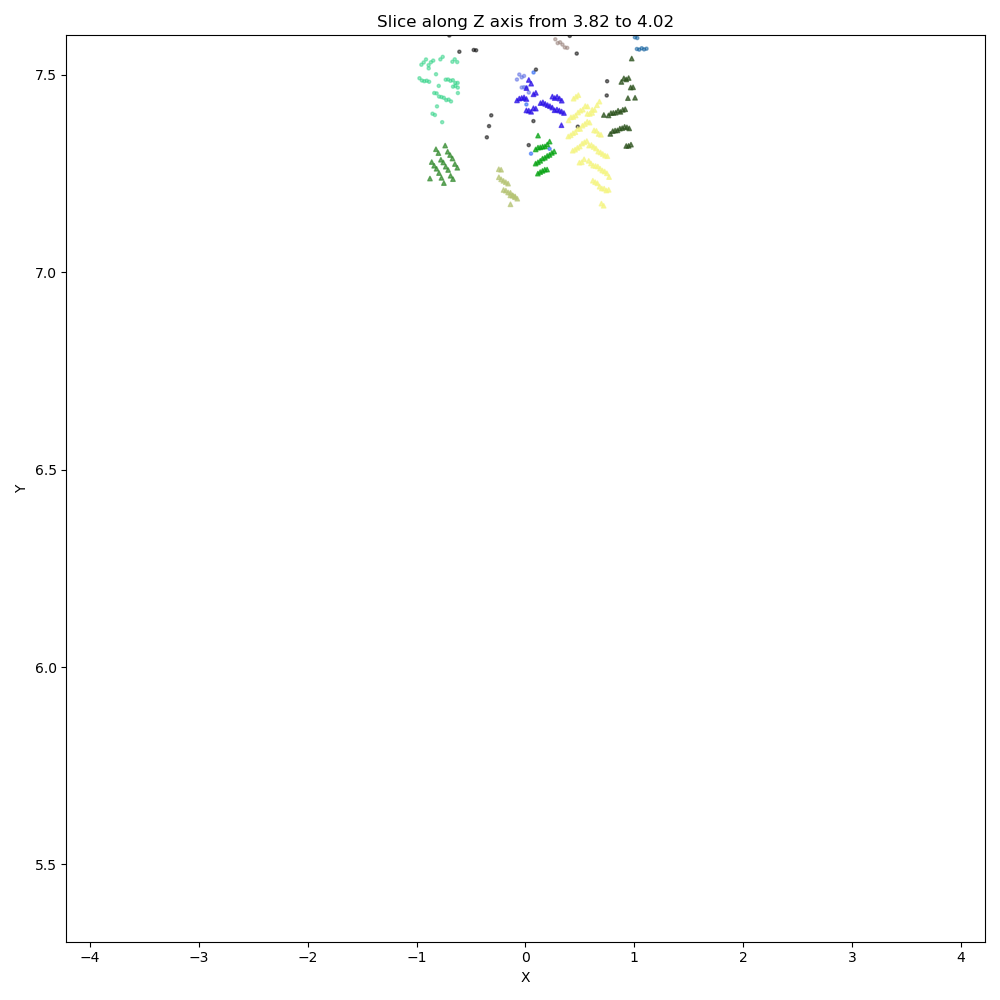

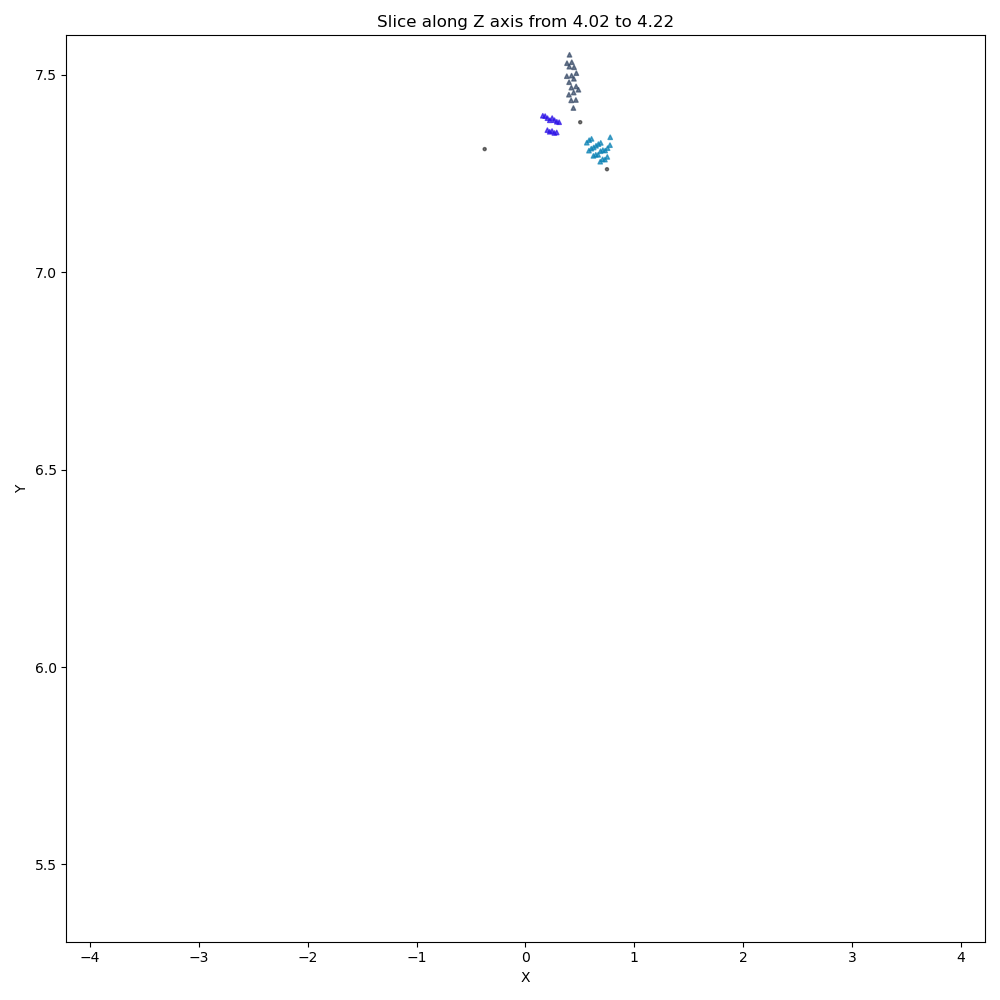

In [39]:
#  plot the tree cutting along the z axis at different heights
z_min = np.min(scaled_points[:,2])
z_max = np.max(scaled_points[:,2])
slice_thickness = 0.20
z = z_min
while z < z_max:
    slice_points = scaled_points[(scaled_points[:,2] >= z) & (scaled_points[:,2] < z + slice_thickness)]
    slice_labels = new_labels[(scaled_points[:,2] >= z) & (scaled_points[:,2] < z + slice_thickness)]
    slice_is_leaf = is_leaf_label[(scaled_points[:,2] >= z) & (scaled_points[:,2] < z + slice_thickness)]
    
    # plot the slice with cluster colors
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(111)
    # valid_indices = slice_labels != -1
    # slice_points_plot = slice_points[valid_indices]
    # slice_labels_plot = slice_labels[valid_indices]
    
    slice_points_plot = slice_points
    slice_labels_plot = slice_labels
    
    colors_plot = np.array([label_to_color[label] for label in slice_labels_plot])
    # plot leaf points as triangles    
    leaf_indices = slice_is_leaf
    non_leaf_indices = ~leaf_indices
    ax.scatter(slice_points_plot[non_leaf_indices,0], slice_points_plot[non_leaf_indices,1], c=colors_plot[non_leaf_indices], s=5, alpha=0.5)
    ax.scatter(slice_points_plot[leaf_indices,0], slice_points_plot[leaf_indices,1], c=colors_plot[leaf_indices], s=10, marker='^', alpha=0.7)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    # ax.set_aspect('equal', adjustable='box')
    ax.set_xlim(np.min(scaled_points[:,0]), np.max(scaled_points[:,0]))
    ax.set_ylim(np.min(scaled_points[:,1]), np.max(scaled_points[:,1]))
    ax.set_title(f'Slice along Z axis from {z:.2f} to {z + slice_thickness:.2f}')
    plt.tight_layout()
    plt.show()
    
    z += slice_thickness

## CT scan along y-axis

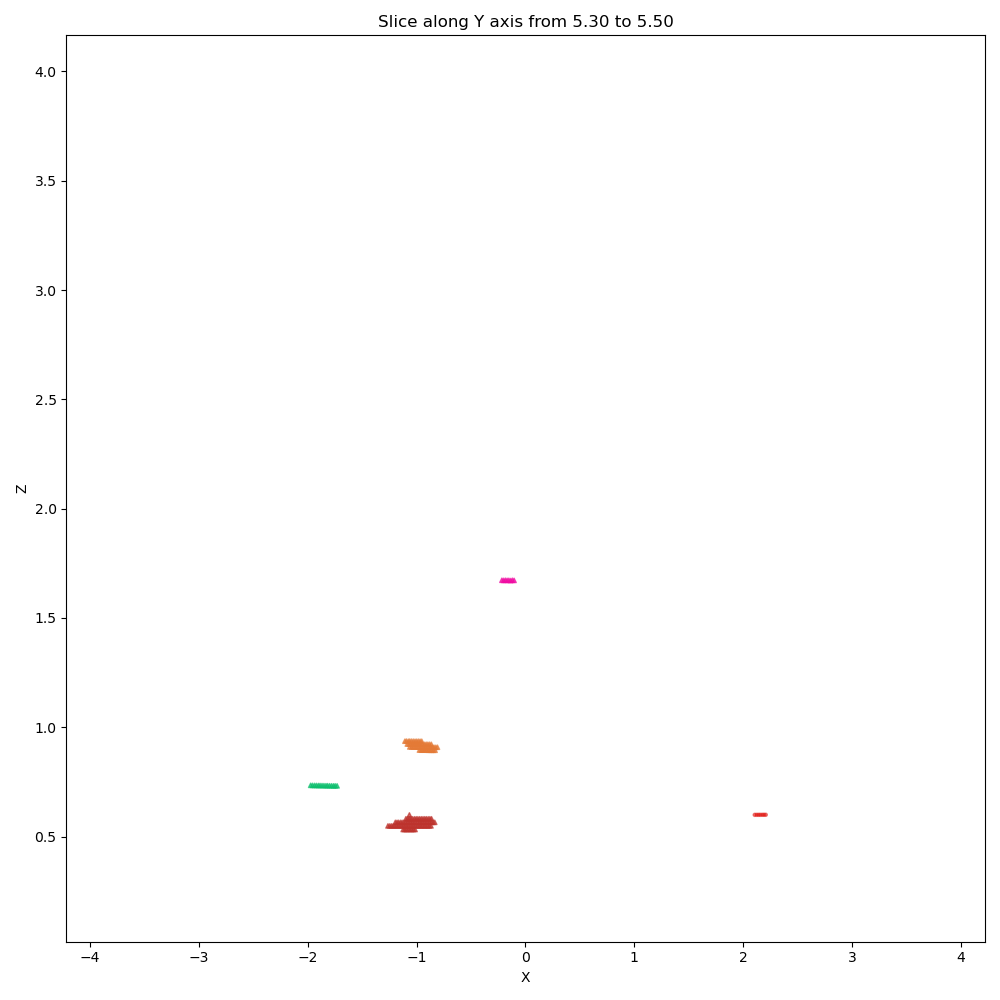

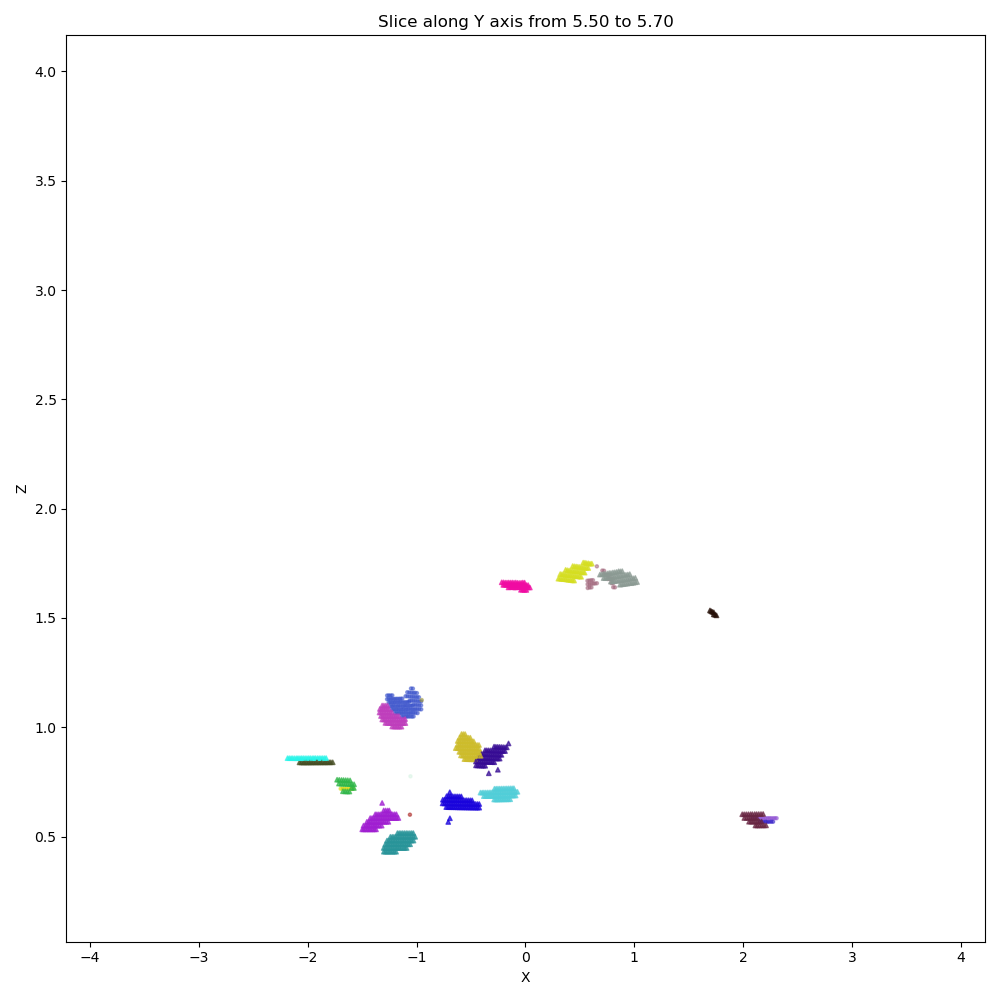

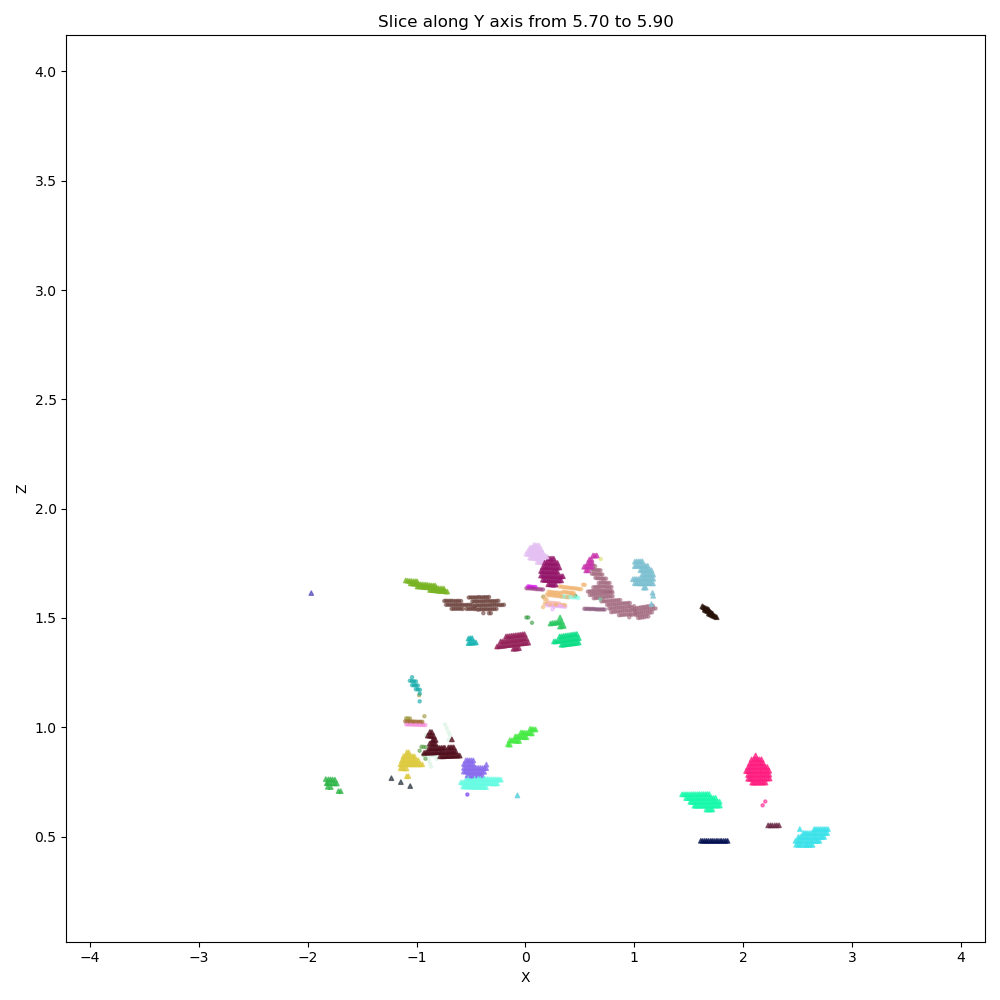

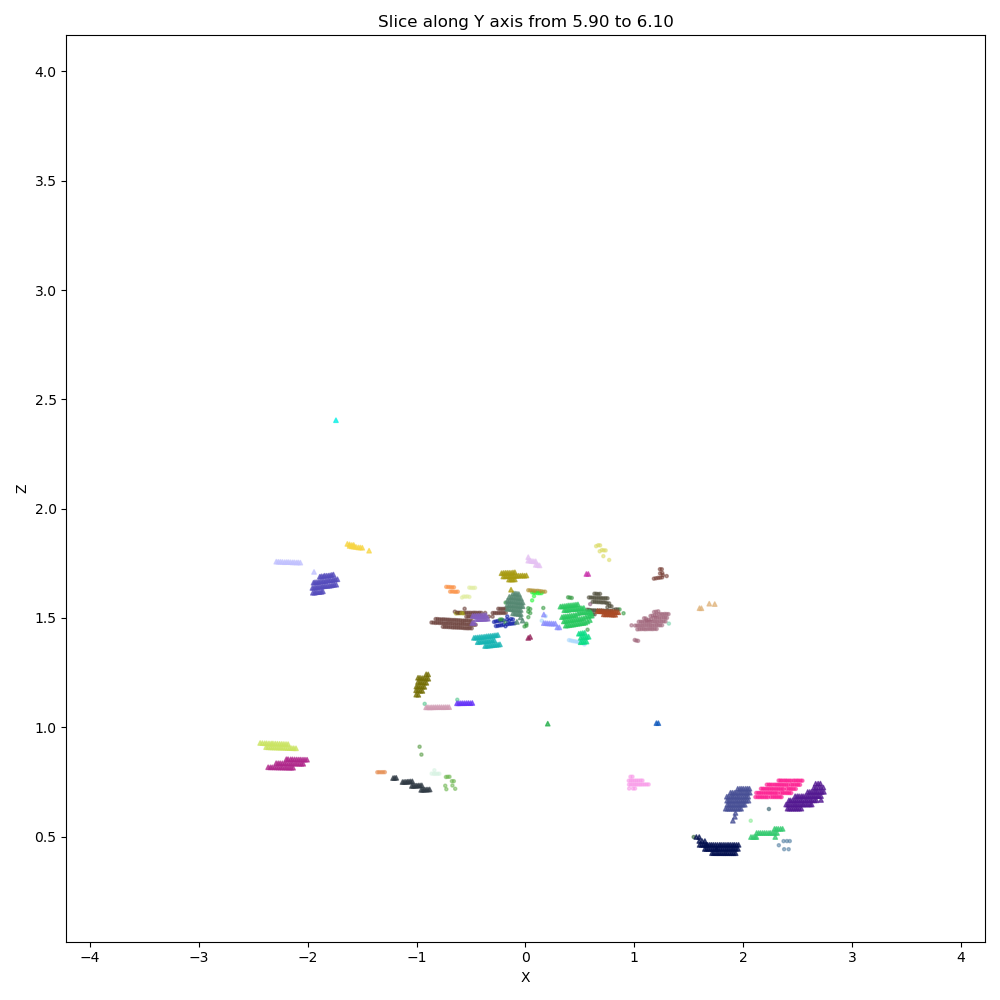

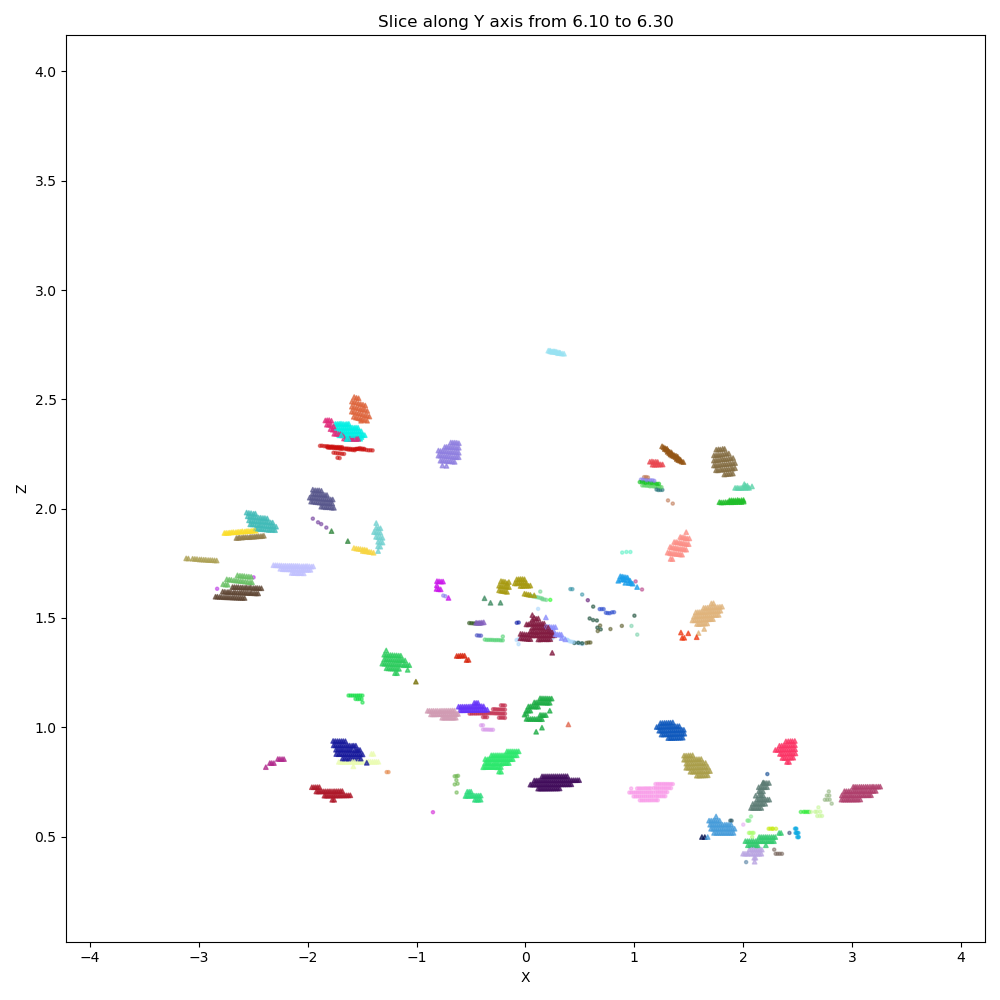

...

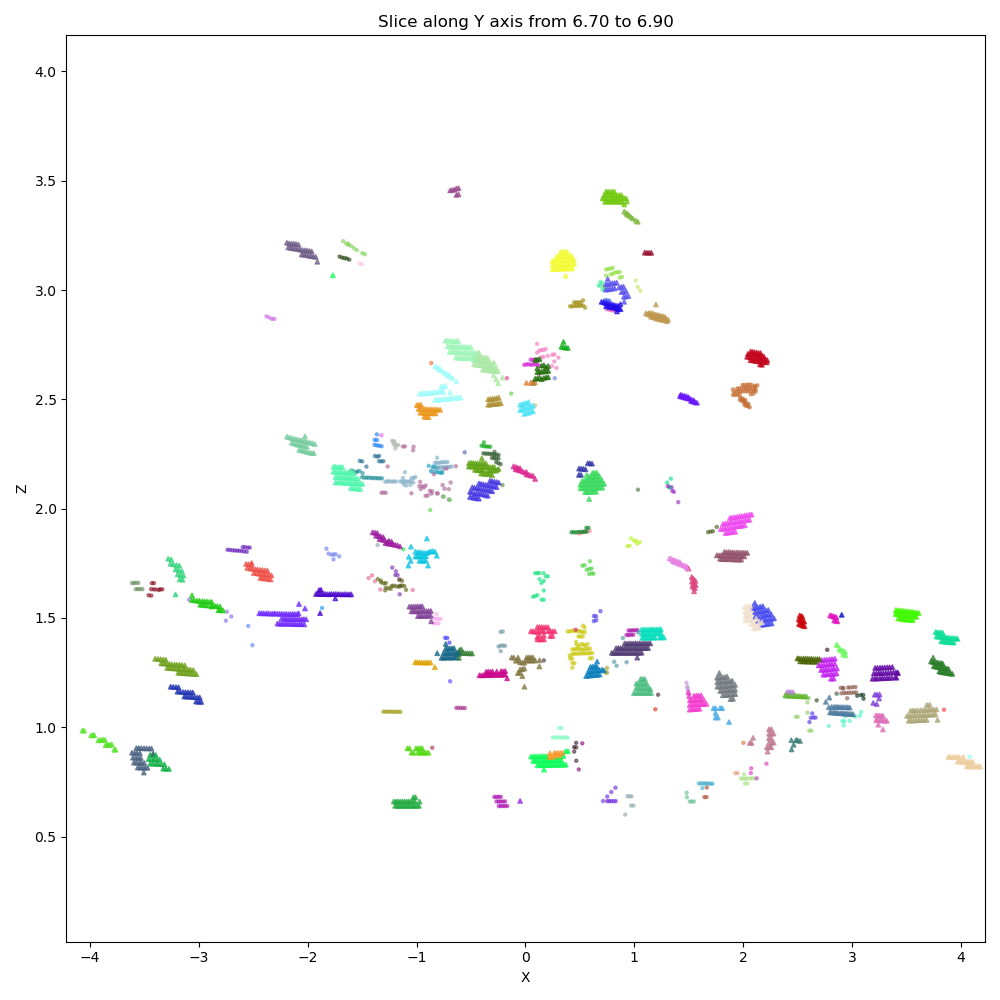

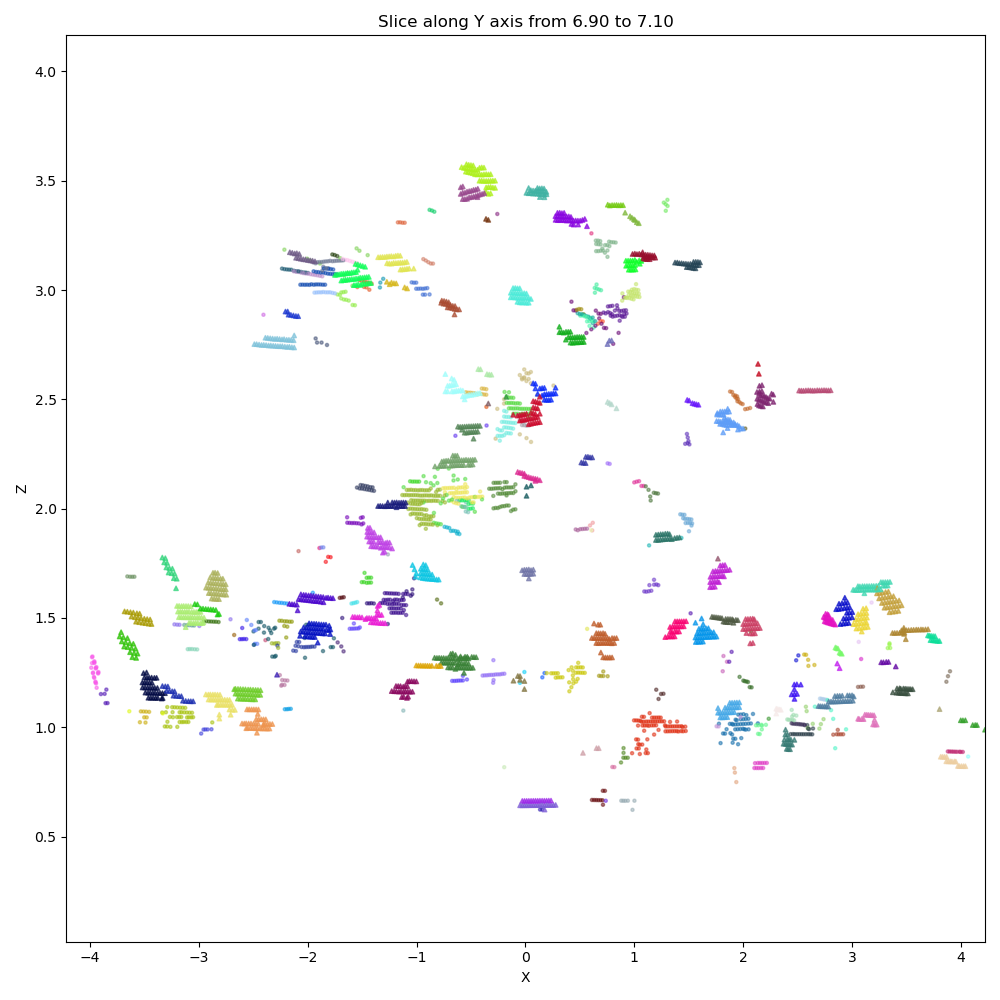

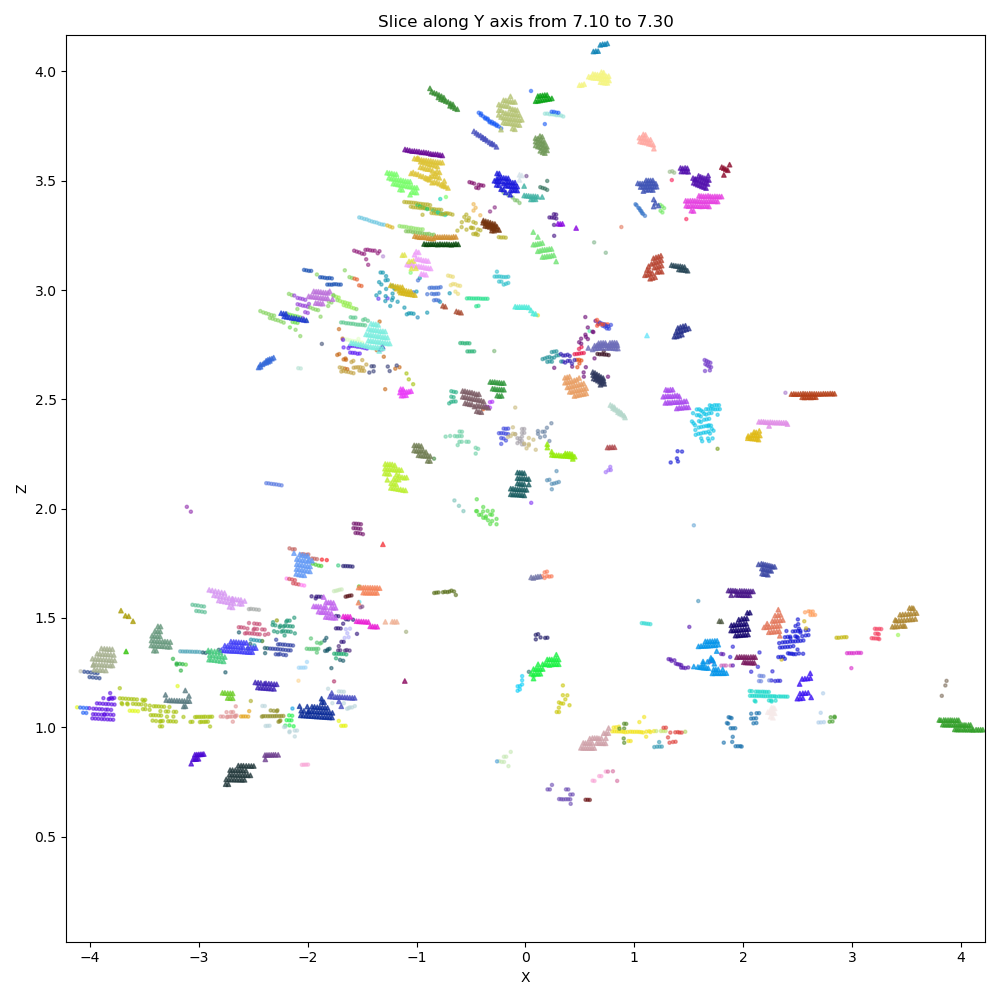

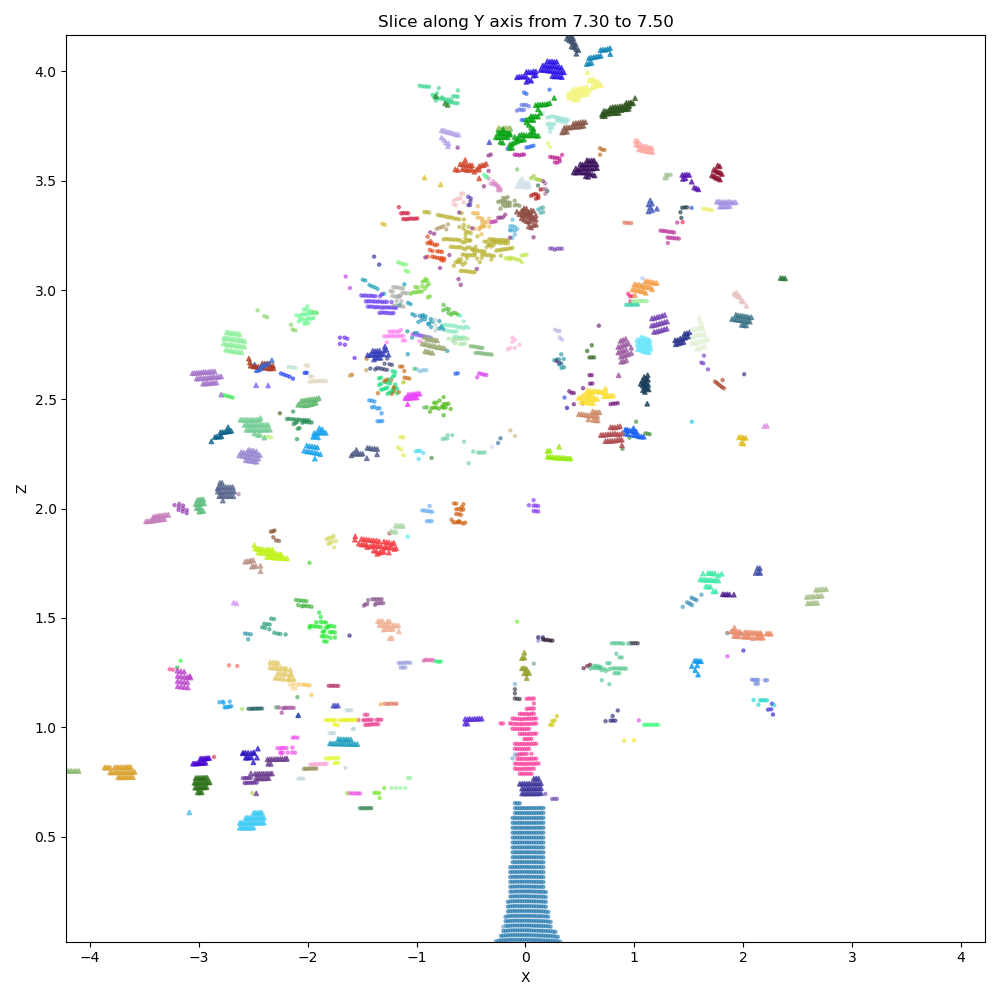

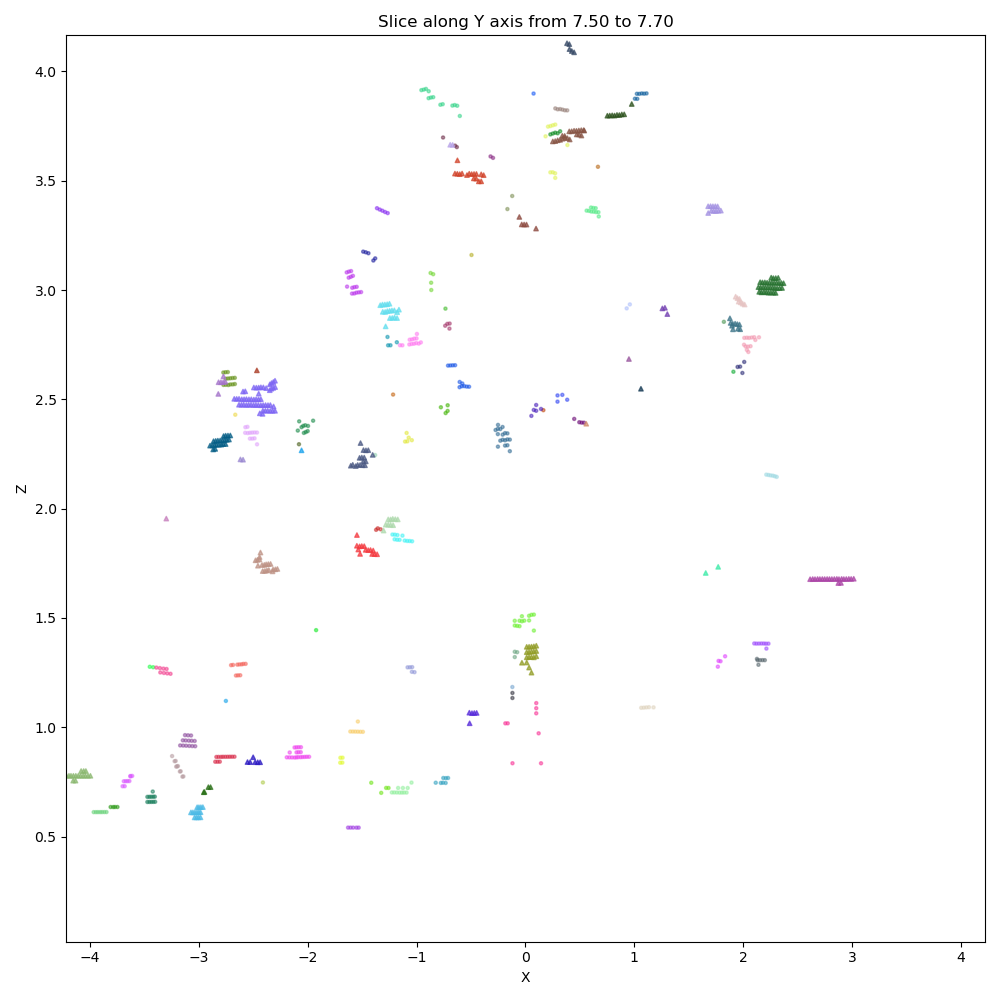

In [40]:
# slices along y axis
y_min = np.min(scaled_points[:,1])
y_max = np.max(scaled_points[:,1])
slice_thickness = 0.2
y = y_min
while y < y_max:
    slice_points = scaled_points[(scaled_points[:,1] >= y) & (scaled_points[:,1] < y + slice_thickness)]
    slice_labels = new_labels[(scaled_points[:,1] >= y) & (scaled_points[:,1] < y + slice_thickness)]
    slice_is_leaf = is_leaf_label[(scaled_points[:,1] >= y) & (scaled_points[:,1] < y + slice_thickness)]
    
    # plot the slice with cluster colors
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(111)
    valid_indices = slice_labels != -1
    slice_points_plot = slice_points[valid_indices]
    slice_labels_plot = slice_labels[valid_indices]
    colors_plot = np.array([label_to_color[label] for label in slice_labels_plot])
    # plot leaf points as triangles    
    leaf_indices = slice_is_leaf[valid_indices]
    non_leaf_indices = ~leaf_indices
    ax.scatter(slice_points_plot[non_leaf_indices,0], slice_points_plot[non_leaf_indices,2], c=colors_plot[non_leaf_indices], s=5, alpha=0.5)
    ax.scatter(slice_points_plot[leaf_indices,0], slice_points_plot[leaf_indices,2], c=colors_plot[leaf_indices], s=10, marker='^', alpha=0.7)
    ax.set_xlabel('X')
    ax.set_ylabel('Z')
    # ax.set_aspect('equal', adjustable='box')
    ax.set_xlim(np.min(scaled_points[:,0]), np.max(scaled_points[:,0]))
    ax.set_ylim(np.min(scaled_points[:,2]), np.max(scaled_points[:,2]))
    ax.set_title(f'Slice along Y axis from {y:.2f} to {y + slice_thickness:.2f}')
    plt.tight_layout()
    plt.show()
    
    y += slice_thickness

In [42]:
# # slices along x axis
# x_min = np.min(scaled_points[:,0])
# x_max = np.max(scaled_points[:,0])
# slice_thickness = 0.2
# x = x_min
# while x < x_max:    
#     slice_points = scaled_points[(scaled_points[:,0] >= x) & (scaled_points[:,0] < x + slice_thickness)]
#     slice_labels = new_labels[(scaled_points[:,0] >= x) & (scaled_points[:,0] < x + slice_thickness)]
#     slice_is_leaf = is_leaf_label[(scaled_points[:,0] >= x) & (scaled_points[:,0] < x + slice_thickness)]
    
#     # plot the slice with cluster colors
#     fig = plt.figure(figsize=(10,10))
#     ax = fig.add_subplot(111)
#     valid_indices = slice_labels != -1
#     slice_points_plot = slice_points[valid_indices]
#     slice_labels_plot = slice_labels[valid_indices]
#     colors_plot = np.array([label_to_color[label] for label in slice_labels_plot])
#     # plot leaf points as triangles    
#     leaf_indices = slice_is_leaf[valid_indices]
#     non_leaf_indices = ~leaf_indices
#     ax.scatter(slice_points_plot[non_leaf_indices,1], slice_points_plot[non_leaf_indices,2], c=colors_plot[non_leaf_indices], s=5, alpha=0.5)
#     ax.scatter(slice_points_plot[leaf_indices,1], slice_points_plot[leaf_indices,2], c=colors_plot[leaf_indices], s=10, marker='^', alpha=0.7)
#     ax.set_xlabel('Y')
#     ax.set_ylabel('Z')
#     # ax.set_aspect('equal', adjustable='box')
#     ax.set_xlim(np.min(scaled_points[:,1]), np.max(scaled_points[:,1]))
#     ax.set_ylim(np.min(scaled_points[:,2]), np.max(scaled_points[:,2]))
#     ax.set_title(f'Slice along X axis from {x:.2f} to {x + slice_thickness:.2f}')
#     plt.tight_layout()
#     plt.show()
    
#     x += slice_thickness